## 1. Denoising Diffusion Probabilistic Models

**Problem 1:** Construct a DDPM on the animal face data. Experiment with three different values of backward inference time - Plot a grid of 10 by 10 images  for all three cases and compute the FID. Take the VAE implemented in Assignment 1 and use it to implement a class-conditional DDPM on its latent space. Use classifier guidance with the score-based formulation

### 1.1 Idea of DDPMs

DDPMs leverage a diffusion process to generate samples. The basic idea is to start from a simple distribution such as Gaussian noise and iteratively apply a diffusion process to transform the noise into samples from the target distribution.

### 1.2 Architecture of DDPM

We have used a UNet architecture with symmetric input and output that are of same spatial dimensions. The diffusion timestep $t$ is incorporated into learning by adding a sinusoidal position embedding to each block.

The U-Net model takes input $x_t$, timestep $t$ to generate an estimate of the noise variance parameter $\epsilon_\theta(x_t, t)$. During training, this parameter is matched with the $\epsilon$ used during forward diffusion. During the inference phase, $\epsilon_\theta(x_t, t)$ is used to generate $x_{t-1}$, and in turn, an estimate of $\epsilon_\theta(x_{t-1}, t-1)$ is generated until we get $x_0$.

The sampling is done from 

$x_{t-1} = \frac{1}{\sqrt{\bar{\alpha_t}}} x_t - \sqrt{(1 - \bar{\alpha_t})} \epsilon_\theta(x_t, t) + \sigma_t z$

#### Architecture

```
UNet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (2): Block(
      (time_mlp): Linear(in_features=32, out_features=512, bias=True)
      (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (3): Block(
      (time_mlp): Linear(in_features=32, out_features=1024, bias=True)
      (conv1): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(1024, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
  )
  (ups): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=512, bias=True)
      (conv1): Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(1024, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): ConvTranspose2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (2): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(512, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (3): Block(
      (time_mlp): Linear(in_features=32, out_features=64, bias=True)
      (conv1): Conv2d(256, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): ConvTranspose2d(64, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
  )
  (output): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
  ```

### 1.3. Loss Function

The loss function for a normal DDPM is derived from the denoising matching term from ELBO. In the simplified form that we use in this assignment for unconditional generation we take the mean squared error between the forward diffusion parameter $\epsilon$ and noise variance estimate $\epsilon_\theta(x_t, t)$

$$ L = \left\| \mathbf{\epsilon  - \epsilon_\theta(x_t, t)} \right\|^2 $$


### 1.4. Hyperparameters for training

| Parameter                       | Value Used     |
|----------------------------------|-------------|
| Batch Size                       | 64         |
| Optimizer                        | Adam        |
| Learning Rate                    | 0.001      |
| Number of epochs | 100 |

We experimented with backward inference time values of 1000, 1500 and 2000 for this assignment.
The fixed variance schedule ranges between 0.0001 and 0.02 as mentioned by the authors of the DDPM paper.  
We implemented unconditional DDPM for 64x64 images due to unavailability of compute power to train for 128x128 images. Training time for 64x64 images for 100 epochs took around 2.5hrs, whereas training for 128x128 images for 100 epochs took around 10.5hrs. On generating images we found that the images were very noisy, which would hence need more training. Due to lack of compute available with us, we chose to train the images for 64x64 images instead which gave good results.

### 1.5. Results

##### 10 x 10 generations for backward inference time = 1000

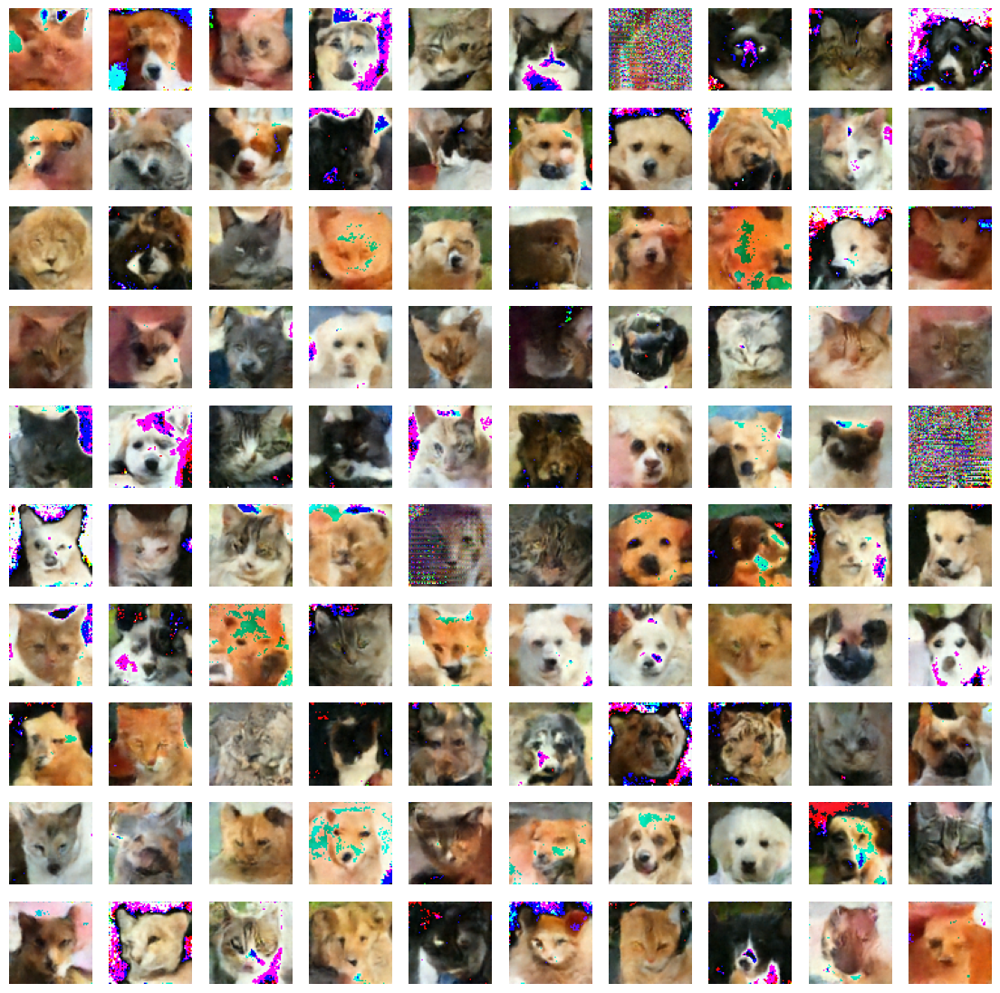

FID Score for backward inference time = 1000 is: **169.22**

<hr>

##### 10 x 10 generations for backward inference time = 1500

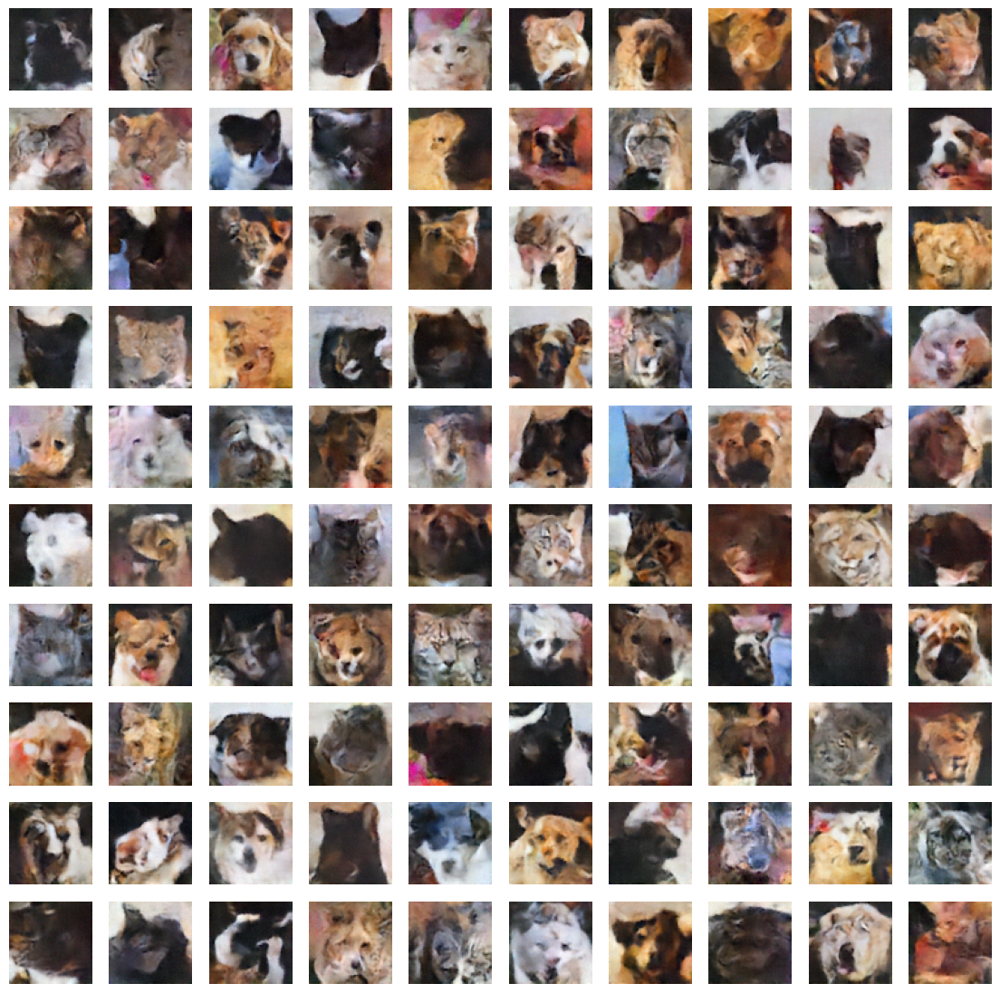

FID Score for backward inference time = 1500: **228.62**

<hr>

##### 10 x 10 generations for backward inference time = 2000

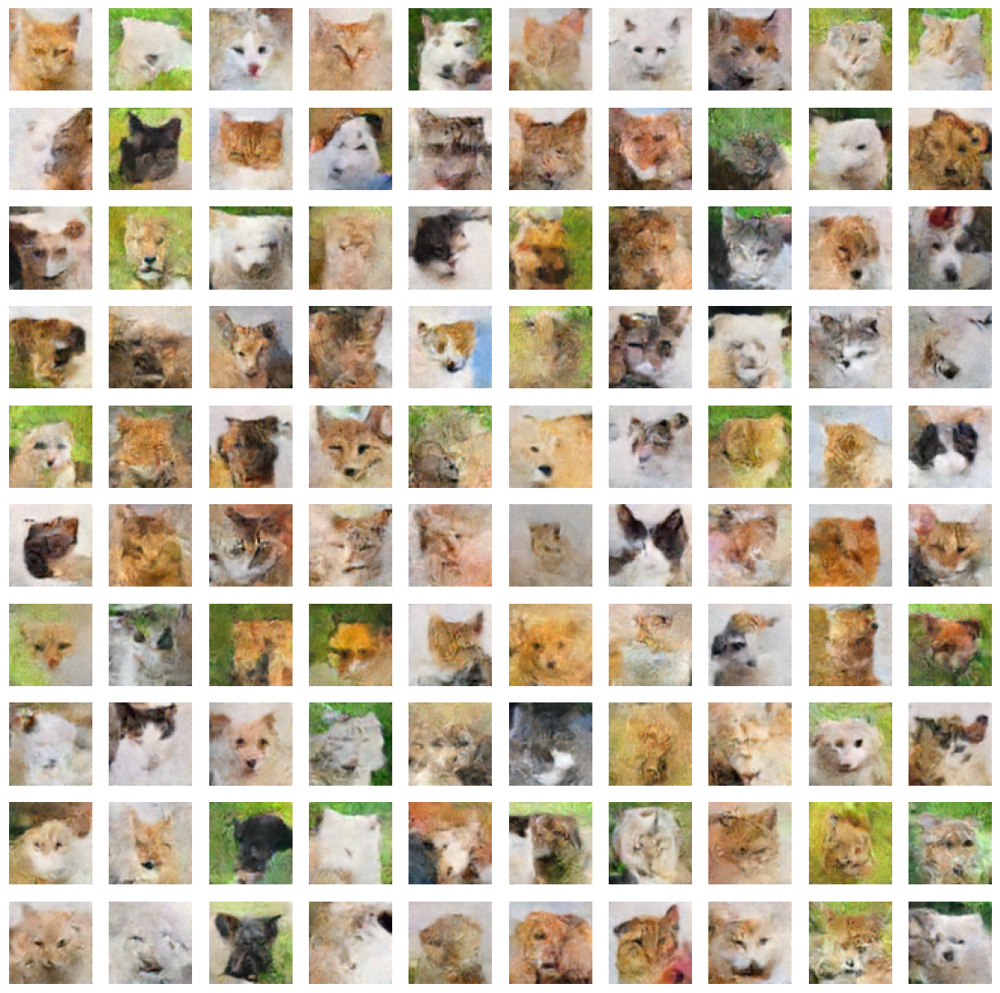

FID Score for backward inference time = 2000: **246.60**

### 1.6. Observations/Inferences

1. As the backward inference time increases, we see an increase in FID score. This may be because on increasing the backward inference time, it may lead to increased model instability. Longer inference times can introduce challenges in training stability, and the model might struggle to converge or generate high-quality samples consistently.
2. Larger the value of the backward inference time, longer it takes for inference.
 
| Backward Inference Time | Time taken to Generate 100 images|
|------------------------|--------------------|
| 1000 | 623 sec |
| 1500 | 942 sec |
| 2000 | 1288 sec |
 
3. As we had access to limited compute power, we could train the model for just 100 epochs. Training for higher number of epochs should generate high quality samples.

## Code

### Imports

In [57]:
import os
import math
import sys
import warnings
import random
import time
import timeit
import tqdm
import numpy as np
from time import time
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
import torchvision
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torchvision.utils import save_image
import torchvision.utils as vutils
from torchvision import datasets
import matplotlib.pyplot as plt
import torch.backends.cudnn as cudnn
from pytorch_fid import fid_score
from torchvision.models import inception_v3

In [76]:
cudnn.benchmark = True
num_epochs = 100
dataset_path = './data/animals/afhq'
IMG_SIZE = 64
BATCH_SIZE = 64
TRAIN = 0
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#### Loading the dataset

In [3]:
class AnimalDataset(Dataset):
    def __init__(self, dataset_path, transform=None):
        self.dataset_path = os.path.join(dataset_path)
        self.transform = transform
        self.dataset_type = os.listdir(self.dataset_path)

        for i in range(len(self.dataset_type)):
            self.dataset_type[i] = os.path.join(self.dataset_path, self.dataset_type[i])

        self.class_names = [os.path.join(dtype, i) for dtype in self.dataset_type for i in os.listdir(dtype)]
        self.class_to_id = {class_name: i for i, class_name in enumerate(self.class_names)}
        self.data = []

        for class_name in self.class_names:
            for image in os.listdir(class_name):
                self.data.append((os.path.join(class_name, image), self.class_to_id[class_name]))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, id):
        image_path, label = self.data[id]
        image = Image.open(image_path)

        if self.transform:
            image = self.transform(image)

        return image, label

In [77]:
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()])

train_dataset = AnimalDataset(dataset_path, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

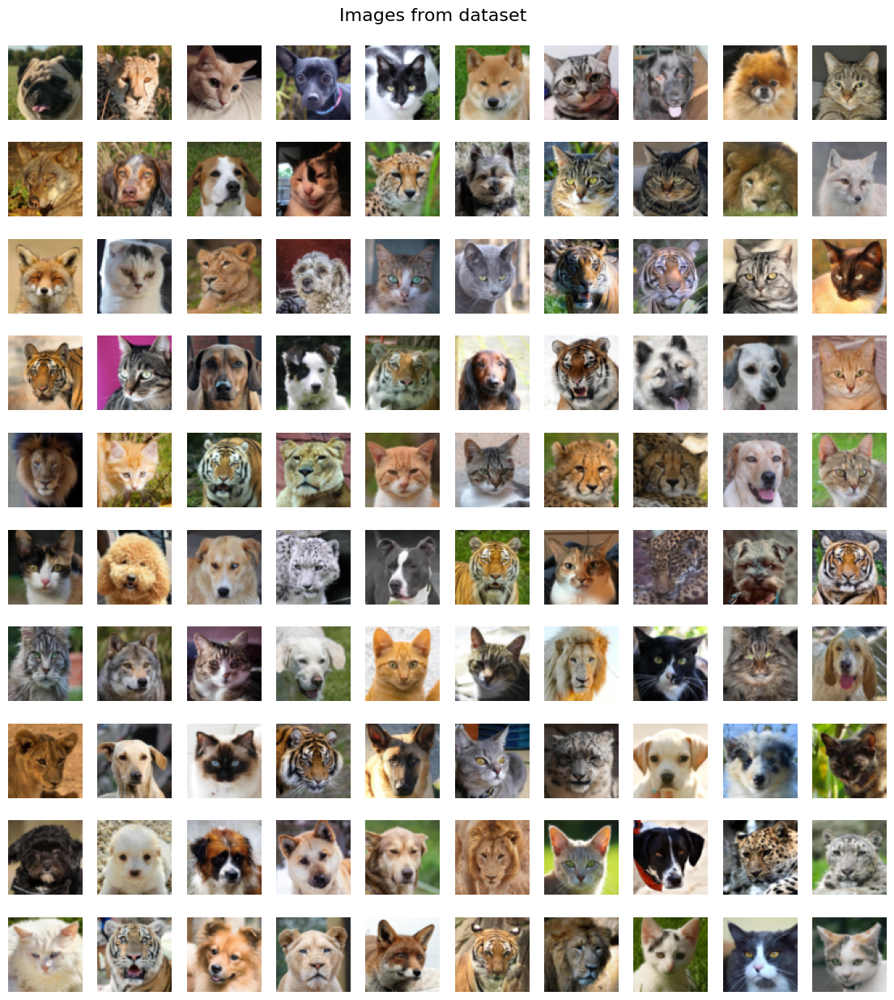

In [75]:
dataiterator = iter(train_dataloader)
images, _ = next(dataiterator)
fig, axes = plt.subplots(10, 10, figsize=(14, 14))
plt.subplots_adjust(wspace=0.2, hspace=0.2, top=0.95)
for i, ax in enumerate(axes.ravel()):
    if i < len(images):
        ax.imshow(images[i].permute(1, 2, 0).numpy())
        ax.axis('off')
plt.suptitle("Images from dataset", fontsize=16)
plt.show()

In [5]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: t.permute(1, 2, 0)),
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))
    plt.axis('off')
    return 0

T = 1000
betas = linear_beta_schedule(timesteps=T)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
CLASSIFIER_SCALE = 0

In [65]:
def forward_diffusion_sample(x_0, t, device="cpu"):
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

def sample_timestep(model, x, t):
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.mse_loss(noise, noise_pred)

def generate_image(model, timestepT):
    model.eval()
    T = timestepT
    img_size = IMG_SIZE

    img = torch.randn((1, 3, img_size, img_size), device=device)
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t)
    return img.detach().cpu()

#### Defining the Block class for UNet

In [8]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        h = self.bnorm1(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm2(self.relu(self.conv2(h)))
        return self.transform(h)

#### Defining the Sinusoidal Embeddings

In [9]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

#### Defining the UNet class

In [15]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

In [62]:
model = UNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)

#### Training the DDPM model

In [14]:
for epoch in range(num_epochs):
    total_loss = 0.0
    start = time()
    print('Running for epoch :', epoch+1)
    for batch_idx, (image, _) in tqdm.tqdm(enumerate(train_dataloader), mininterval=30):
        t = torch.randint(0, T, (image.shape[0],), device=device).long()
        loss = get_loss(model, image, t)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    end = time()

    print(f"Epoch [{epoch+1}/{num_epochs}] \t Loss: {total_loss:.6f} \t Time: {end-start:.2f}")
torch.save(model.state_dict(), f'ddpm_models/100_ddpm_final.pt')

Running for epoch : 1


253it [01:37,  2.59it/s]


Epoch [1/100] 	 Loss: 53.466148 	 Time: 97.86
Running for epoch : 2


253it [01:26,  2.92it/s]


Epoch [2/100] 	 Loss: 30.076760 	 Time: 86.62
Running for epoch : 3


253it [01:26,  2.91it/s]


Epoch [3/100] 	 Loss: 25.055280 	 Time: 86.83
Running for epoch : 4


253it [01:27,  2.90it/s]


Epoch [4/100] 	 Loss: 22.747856 	 Time: 87.24
Running for epoch : 5


253it [01:26,  2.91it/s]


Epoch [5/100] 	 Loss: 21.382163 	 Time: 86.83
Running for epoch : 6


253it [01:26,  2.92it/s]


Epoch [6/100] 	 Loss: 20.545224 	 Time: 86.65
Running for epoch : 7


253it [01:24,  2.99it/s]


Epoch [7/100] 	 Loss: 20.236909 	 Time: 84.68
Running for epoch : 8


253it [01:24,  2.99it/s]


Epoch [8/100] 	 Loss: 19.469969 	 Time: 84.61
Running for epoch : 9


253it [01:24,  2.99it/s]


Epoch [9/100] 	 Loss: 19.171101 	 Time: 84.61
Running for epoch : 10


253it [01:24,  2.99it/s]


Epoch [10/100] 	 Loss: 18.959478 	 Time: 84.62
Running for epoch : 11


253it [01:24,  2.99it/s]


Epoch [11/100] 	 Loss: 19.298354 	 Time: 84.57
Running for epoch : 12


253it [01:24,  2.99it/s]


Epoch [12/100] 	 Loss: 18.579237 	 Time: 84.55
Running for epoch : 13


253it [01:24,  2.99it/s]


Epoch [13/100] 	 Loss: 18.276459 	 Time: 84.68
Running for epoch : 14


253it [01:24,  3.00it/s]


Epoch [14/100] 	 Loss: 18.101989 	 Time: 84.36
Running for epoch : 15


253it [01:24,  3.00it/s]


Epoch [15/100] 	 Loss: 17.958944 	 Time: 84.27
Running for epoch : 16


253it [01:24,  2.99it/s]


Epoch [16/100] 	 Loss: 18.006442 	 Time: 84.56
Running for epoch : 17


253it [01:24,  2.99it/s]


Epoch [17/100] 	 Loss: 18.159767 	 Time: 84.65
Running for epoch : 18


253it [01:24,  2.99it/s]


Epoch [18/100] 	 Loss: 18.310102 	 Time: 84.56
Running for epoch : 19


253it [01:24,  2.99it/s]


Epoch [19/100] 	 Loss: 17.969747 	 Time: 84.57
Running for epoch : 20


253it [01:24,  2.99it/s]


Epoch [20/100] 	 Loss: 17.651618 	 Time: 84.49
Running for epoch : 21


253it [01:24,  2.99it/s]


Epoch [21/100] 	 Loss: 17.392599 	 Time: 84.62
Running for epoch : 22


253it [01:24,  2.98it/s]


Epoch [22/100] 	 Loss: 17.781487 	 Time: 84.85
Running for epoch : 23


253it [01:24,  2.99it/s]


Epoch [23/100] 	 Loss: 17.992119 	 Time: 84.54
Running for epoch : 24


253it [01:24,  3.00it/s]


Epoch [24/100] 	 Loss: 18.195299 	 Time: 84.43
Running for epoch : 25


253it [01:24,  2.99it/s]


Epoch [25/100] 	 Loss: 17.252187 	 Time: 84.68
Running for epoch : 26


253it [01:24,  2.99it/s]


Epoch [26/100] 	 Loss: 17.197207 	 Time: 84.55
Running for epoch : 27


253it [01:24,  2.98it/s]


Epoch [27/100] 	 Loss: 17.223994 	 Time: 84.82
Running for epoch : 28


253it [01:24,  3.00it/s]


Epoch [28/100] 	 Loss: 17.304834 	 Time: 84.38
Running for epoch : 29


253it [01:24,  2.99it/s]


Epoch [29/100] 	 Loss: 17.071929 	 Time: 84.61
Running for epoch : 30


253it [01:25,  2.98it/s]


Epoch [30/100] 	 Loss: 17.119335 	 Time: 85.04
Running for epoch : 31


253it [01:24,  2.99it/s]


Epoch [31/100] 	 Loss: 17.866705 	 Time: 84.64
Running for epoch : 32


253it [01:24,  2.99it/s]


Epoch [32/100] 	 Loss: 17.229618 	 Time: 84.62
Running for epoch : 33


253it [01:24,  3.00it/s]


Epoch [33/100] 	 Loss: 17.036462 	 Time: 84.47
Running for epoch : 34


253it [01:24,  2.98it/s]


Epoch [34/100] 	 Loss: 16.787963 	 Time: 84.78
Running for epoch : 35


253it [01:24,  2.99it/s]


Epoch [35/100] 	 Loss: 16.753949 	 Time: 84.55
Running for epoch : 36


253it [01:24,  2.99it/s]


Epoch [36/100] 	 Loss: 16.904388 	 Time: 84.66
Running for epoch : 37


253it [01:24,  2.99it/s]


Epoch [37/100] 	 Loss: 16.505639 	 Time: 84.68
Running for epoch : 38


253it [01:24,  2.99it/s]


Epoch [38/100] 	 Loss: 16.635096 	 Time: 84.68
Running for epoch : 39


253it [01:24,  2.99it/s]


Epoch [39/100] 	 Loss: 16.561848 	 Time: 84.62
Running for epoch : 40


253it [01:24,  2.99it/s]


Epoch [40/100] 	 Loss: 17.042016 	 Time: 84.69
Running for epoch : 41


253it [01:24,  3.00it/s]


Epoch [41/100] 	 Loss: 16.838393 	 Time: 84.41
Running for epoch : 42


253it [01:24,  2.99it/s]


Epoch [42/100] 	 Loss: 16.494201 	 Time: 84.75
Running for epoch : 43


253it [01:24,  2.99it/s]


Epoch [43/100] 	 Loss: 16.446583 	 Time: 84.64
Running for epoch : 44


253it [01:24,  2.99it/s]


Epoch [44/100] 	 Loss: 16.443399 	 Time: 84.56
Running for epoch : 45


253it [01:24,  3.00it/s]


Epoch [45/100] 	 Loss: 16.497136 	 Time: 84.43
Running for epoch : 46


253it [01:24,  2.99it/s]


Epoch [46/100] 	 Loss: 16.603392 	 Time: 84.60
Running for epoch : 47


253it [01:24,  2.99it/s]


Epoch [47/100] 	 Loss: 16.463756 	 Time: 84.75
Running for epoch : 48


253it [01:24,  2.99it/s]


Epoch [48/100] 	 Loss: 16.667132 	 Time: 84.55
Running for epoch : 49


253it [01:24,  2.99it/s]


Epoch [49/100] 	 Loss: 16.890446 	 Time: 84.49
Running for epoch : 50


253it [01:24,  2.99it/s]


Epoch [50/100] 	 Loss: 16.323118 	 Time: 84.74
Running for epoch : 51


253it [01:24,  2.99it/s]


Epoch [51/100] 	 Loss: 16.511358 	 Time: 84.54
Running for epoch : 52


253it [01:24,  2.98it/s]


Epoch [52/100] 	 Loss: 16.369471 	 Time: 84.76
Running for epoch : 53


253it [01:24,  2.99it/s]


Epoch [53/100] 	 Loss: 16.372020 	 Time: 84.56
Running for epoch : 54


253it [01:24,  3.00it/s]


Epoch [54/100] 	 Loss: 16.369021 	 Time: 84.43
Running for epoch : 55


253it [01:24,  2.99it/s]


Epoch [55/100] 	 Loss: 16.548256 	 Time: 84.72
Running for epoch : 56


253it [01:24,  2.98it/s]


Epoch [56/100] 	 Loss: 16.643218 	 Time: 84.83
Running for epoch : 57


253it [01:24,  3.00it/s]


Epoch [57/100] 	 Loss: 16.663280 	 Time: 84.45
Running for epoch : 58


253it [01:24,  2.99it/s]


Epoch [58/100] 	 Loss: 16.684599 	 Time: 84.57
Running for epoch : 59


253it [01:24,  2.99it/s]


Epoch [59/100] 	 Loss: 16.244727 	 Time: 84.52
Running for epoch : 60


253it [01:24,  2.99it/s]


Epoch [60/100] 	 Loss: 16.583791 	 Time: 84.66
Running for epoch : 61


253it [01:24,  3.00it/s]


Epoch [61/100] 	 Loss: 16.347717 	 Time: 84.42
Running for epoch : 62


253it [01:24,  2.99it/s]


Epoch [62/100] 	 Loss: 16.126134 	 Time: 84.56
Running for epoch : 63


253it [01:24,  3.00it/s]


Epoch [63/100] 	 Loss: 16.098088 	 Time: 84.41
Running for epoch : 64


253it [01:24,  2.99it/s]


Epoch [64/100] 	 Loss: 16.198380 	 Time: 84.56
Running for epoch : 65


253it [01:24,  2.99it/s]


Epoch [65/100] 	 Loss: 16.060323 	 Time: 84.52
Running for epoch : 66


253it [01:24,  3.00it/s]


Epoch [66/100] 	 Loss: 16.219394 	 Time: 84.42
Running for epoch : 67


253it [01:24,  3.00it/s]


Epoch [67/100] 	 Loss: 16.251328 	 Time: 84.46
Running for epoch : 68


253it [01:24,  2.99it/s]


Epoch [68/100] 	 Loss: 16.183909 	 Time: 84.67
Running for epoch : 69


253it [01:24,  3.00it/s]


Epoch [69/100] 	 Loss: 16.217004 	 Time: 84.40
Running for epoch : 70


253it [01:24,  2.99it/s]


Epoch [70/100] 	 Loss: 16.332180 	 Time: 84.57
Running for epoch : 71


253it [01:24,  2.99it/s]


Epoch [71/100] 	 Loss: 16.158519 	 Time: 84.52
Running for epoch : 72


253it [01:24,  3.00it/s]


Epoch [72/100] 	 Loss: 15.994681 	 Time: 84.46
Running for epoch : 73


253it [01:24,  2.99it/s]


Epoch [73/100] 	 Loss: 16.059091 	 Time: 84.51
Running for epoch : 74


253it [01:24,  3.00it/s]


Epoch [74/100] 	 Loss: 16.633238 	 Time: 84.37
Running for epoch : 75


253it [01:24,  2.99it/s]


Epoch [75/100] 	 Loss: 15.881514 	 Time: 84.48
Running for epoch : 76


253it [01:24,  3.00it/s]


Epoch [76/100] 	 Loss: 16.149305 	 Time: 84.42
Running for epoch : 77


253it [01:25,  2.97it/s]


Epoch [77/100] 	 Loss: 16.145731 	 Time: 85.31
Running for epoch : 78


253it [01:25,  2.96it/s]


Epoch [78/100] 	 Loss: 16.120793 	 Time: 85.53
Running for epoch : 79


253it [01:24,  2.99it/s]


Epoch [79/100] 	 Loss: 15.955112 	 Time: 84.63
Running for epoch : 80


253it [01:24,  2.99it/s]


Epoch [80/100] 	 Loss: 16.147018 	 Time: 84.50
Running for epoch : 81


253it [01:24,  2.99it/s]


Epoch [81/100] 	 Loss: 15.904520 	 Time: 84.64
Running for epoch : 82


253it [01:24,  2.98it/s]


Epoch [82/100] 	 Loss: 15.947467 	 Time: 84.78
Running for epoch : 83


253it [01:24,  2.99it/s]


Epoch [83/100] 	 Loss: 15.754221 	 Time: 84.59
Running for epoch : 84


253it [01:24,  3.00it/s]


Epoch [84/100] 	 Loss: 16.189046 	 Time: 84.44
Running for epoch : 85


253it [01:24,  2.99it/s]


Epoch [85/100] 	 Loss: 15.800094 	 Time: 84.68
Running for epoch : 86


253it [01:24,  2.99it/s]


Epoch [86/100] 	 Loss: 16.250261 	 Time: 84.70
Running for epoch : 87


253it [01:24,  2.99it/s]


Epoch [87/100] 	 Loss: 15.954430 	 Time: 84.48
Running for epoch : 88


253it [01:24,  3.00it/s]


Epoch [88/100] 	 Loss: 15.812340 	 Time: 84.39
Running for epoch : 89


253it [01:24,  2.99it/s]


Epoch [89/100] 	 Loss: 15.912021 	 Time: 84.71
Running for epoch : 90


253it [01:24,  2.99it/s]


Epoch [90/100] 	 Loss: 16.076552 	 Time: 84.69
Running for epoch : 91


253it [01:24,  3.00it/s]


Epoch [91/100] 	 Loss: 15.884748 	 Time: 84.40
Running for epoch : 92


253it [01:24,  2.99it/s]


Epoch [92/100] 	 Loss: 16.086002 	 Time: 84.69
Running for epoch : 93


253it [01:24,  2.99it/s]


Epoch [93/100] 	 Loss: 15.655973 	 Time: 84.63
Running for epoch : 94


253it [01:24,  2.99it/s]


Epoch [94/100] 	 Loss: 15.977732 	 Time: 84.68
Running for epoch : 95


253it [01:24,  2.99it/s]


Epoch [95/100] 	 Loss: 15.982540 	 Time: 84.57
Running for epoch : 96


253it [01:24,  2.99it/s]


Epoch [96/100] 	 Loss: 15.947926 	 Time: 84.49
Running for epoch : 97


253it [01:24,  2.98it/s]


Epoch [97/100] 	 Loss: 15.582813 	 Time: 84.83
Running for epoch : 98


253it [01:24,  2.99it/s]


Epoch [98/100] 	 Loss: 15.650496 	 Time: 84.75
Running for epoch : 99


253it [01:24,  2.99it/s]


Epoch [99/100] 	 Loss: 15.845010 	 Time: 84.50
Running for epoch : 100


253it [01:24,  2.98it/s]


Epoch [100/100] 	 Loss: 15.825985 	 Time: 84.93


#### Defining a common training function to train the DDPM for different backward instance times

In [21]:
def training_loop(num_epochs, train_dataloader, name_of_model, steps=1000):

    def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
        return torch.linspace(start, end, timesteps)

    def get_index_from_list(vals, t, x_shape):
        batch_size = t.shape[0]
        out = vals.gather(-1, t.cpu())
        return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

    def show_tensor_image(image):
        reverse_transforms = transforms.Compose([
            transforms.Lambda(lambda t: t.permute(1, 2, 0)),
            transforms.Lambda(lambda t: t * 255.),
            transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
            transforms.ToPILImage(),
        ])

        # Take first image of batch
        if len(image.shape) == 4:
            image = image[0, :, :, :]
        plt.imshow(reverse_transforms(image))
        plt.axis('off')
        return 0
    
    def forward_diffusion_sample(x_0, t, device="cpu"):
        noise = torch.randn_like(x_0)
        sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
        return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

    def sample_timestep(x, t):
        betas_t = get_index_from_list(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
        model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
        posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
        
        if t == 0:
            return model_mean
        else:
            noise = torch.randn_like(x)
            return model_mean + torch.sqrt(posterior_variance_t) * noise 

    def get_loss(model, x_0, t):
        x_noisy, noise = forward_diffusion_sample(x_0, t, device)
        noise_pred = model(x_noisy, t)
        return F.mse_loss(noise, noise_pred)

    def sample_plot_image():
        model.eval()
        img_size = IMG_SIZE
        plt.figure(figsize=(8,8))
        plt.axis('off')
        num_images = 1
        num_attempts = 100
        stepsize = int(T/num_images)

        for j in tqdm.tqdm(range(num_attempts), mininterval=10):
            img = torch.randn((1, 3, img_size, img_size), device=device)
            for i in range(0,T)[::-1]:
                t = torch.full((1,), i, device=device, dtype=torch.long)
                img = sample_timestep(img, t)
            plt.subplot(10, 10, j+1)
            show_tensor_image(img.detach().cpu())
        plt.show()
        return 0
        
    T = steps
    betas = linear_beta_schedule(timesteps=T)
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    model = UNet().to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        total_loss = 0.0
        start = time()
        print('Running for epoch :', epoch+1)
        for batch_idx, (image, _) in tqdm.tqdm(enumerate(train_dataloader), mininterval=30):
            t = torch.randint(0, T, (image.shape[0],), device=device).long()
            loss = get_loss(model, image, t)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        end = time()

        print(f"Epoch [{epoch+1}/{num_epochs}] \t Loss: {total_loss:.6f} \t Time: {end-start:.2f}")
    torch.save(model.state_dict(), f'ddpm_models/{name_of_model}.pt')

In [22]:
# training the model for backward inference time T=1500
training_loop(100, train_dataloader, '100_ddpm_final_1500_steps', steps=1500)

Running for epoch : 1


253it [01:43,  2.44it/s]


Epoch [1/100] 	 Loss: 50.378653 	 Time: 103.67
Running for epoch : 2


253it [01:26,  2.91it/s]


Epoch [2/100] 	 Loss: 25.773023 	 Time: 86.89
Running for epoch : 3


253it [01:26,  2.93it/s]


Epoch [3/100] 	 Loss: 20.932283 	 Time: 86.29
Running for epoch : 4


253it [01:26,  2.93it/s]


Epoch [4/100] 	 Loss: 21.378926 	 Time: 86.34
Running for epoch : 5


253it [01:26,  2.92it/s]


Epoch [5/100] 	 Loss: 19.015550 	 Time: 86.57
Running for epoch : 6


253it [01:26,  2.93it/s]


Epoch [6/100] 	 Loss: 18.353424 	 Time: 86.37
Running for epoch : 7


253it [01:26,  2.93it/s]


Epoch [7/100] 	 Loss: 17.575525 	 Time: 86.47
Running for epoch : 8


253it [01:26,  2.92it/s]


Epoch [8/100] 	 Loss: 17.367553 	 Time: 86.74
Running for epoch : 9


253it [01:26,  2.92it/s]


Epoch [9/100] 	 Loss: 17.406042 	 Time: 86.77
Running for epoch : 10


253it [01:26,  2.93it/s]


Epoch [10/100] 	 Loss: 17.393629 	 Time: 86.25
Running for epoch : 11


253it [01:26,  2.93it/s]


Epoch [11/100] 	 Loss: 16.946345 	 Time: 86.44
Running for epoch : 12


253it [01:26,  2.92it/s]


Epoch [12/100] 	 Loss: 16.627829 	 Time: 86.61
Running for epoch : 13


253it [01:26,  2.91it/s]


Epoch [13/100] 	 Loss: 16.257219 	 Time: 86.94
Running for epoch : 14


253it [01:27,  2.89it/s]


Epoch [14/100] 	 Loss: 16.175196 	 Time: 87.57
Running for epoch : 15


253it [01:27,  2.90it/s]


Epoch [15/100] 	 Loss: 16.062907 	 Time: 87.15
Running for epoch : 16


253it [01:27,  2.91it/s]


Epoch [16/100] 	 Loss: 16.137541 	 Time: 87.07
Running for epoch : 17


253it [01:27,  2.89it/s]


Epoch [17/100] 	 Loss: 15.966771 	 Time: 87.40
Running for epoch : 18


253it [01:25,  2.94it/s]


Epoch [18/100] 	 Loss: 15.817016 	 Time: 85.95
Running for epoch : 19


253it [01:24,  3.00it/s]


Epoch [19/100] 	 Loss: 15.467150 	 Time: 84.43
Running for epoch : 20


253it [01:24,  3.00it/s]


Epoch [20/100] 	 Loss: 15.789780 	 Time: 84.42
Running for epoch : 21


253it [01:24,  3.00it/s]


Epoch [21/100] 	 Loss: 15.651935 	 Time: 84.44
Running for epoch : 22


253it [01:24,  3.00it/s]


Epoch [22/100] 	 Loss: 15.357273 	 Time: 84.39
Running for epoch : 23


253it [01:24,  3.00it/s]


Epoch [23/100] 	 Loss: 15.055880 	 Time: 84.46
Running for epoch : 24


253it [01:24,  3.00it/s]


Epoch [24/100] 	 Loss: 15.291731 	 Time: 84.30
Running for epoch : 25


253it [01:24,  3.00it/s]


Epoch [25/100] 	 Loss: 15.326154 	 Time: 84.27
Running for epoch : 26


253it [01:24,  3.00it/s]


Epoch [26/100] 	 Loss: 15.224655 	 Time: 84.46
Running for epoch : 27


253it [01:24,  3.01it/s]


Epoch [27/100] 	 Loss: 14.808541 	 Time: 84.14
Running for epoch : 28


253it [01:24,  2.99it/s]


Epoch [28/100] 	 Loss: 14.915659 	 Time: 84.51
Running for epoch : 29


253it [01:24,  2.99it/s]


Epoch [29/100] 	 Loss: 14.861578 	 Time: 84.48
Running for epoch : 30


253it [01:24,  2.99it/s]


Epoch [30/100] 	 Loss: 14.916346 	 Time: 84.49
Running for epoch : 31


253it [01:24,  3.00it/s]


Epoch [31/100] 	 Loss: 14.960860 	 Time: 84.43
Running for epoch : 32


253it [01:24,  3.01it/s]


Epoch [32/100] 	 Loss: 14.575078 	 Time: 84.15
Running for epoch : 33


253it [01:24,  3.00it/s]


Epoch [33/100] 	 Loss: 14.771087 	 Time: 84.28
Running for epoch : 34


253it [01:24,  3.00it/s]


Epoch [34/100] 	 Loss: 15.095430 	 Time: 84.47
Running for epoch : 35


253it [01:24,  2.99it/s]


Epoch [35/100] 	 Loss: 14.325006 	 Time: 84.56
Running for epoch : 36


253it [01:24,  3.00it/s]


Epoch [36/100] 	 Loss: 14.585743 	 Time: 84.41
Running for epoch : 37


253it [01:24,  3.00it/s]


Epoch [37/100] 	 Loss: 14.836108 	 Time: 84.41
Running for epoch : 38


253it [01:24,  3.00it/s]


Epoch [38/100] 	 Loss: 14.406536 	 Time: 84.44
Running for epoch : 39


253it [01:24,  3.00it/s]


Epoch [39/100] 	 Loss: 14.413812 	 Time: 84.24
Running for epoch : 40


253it [01:24,  3.00it/s]


Epoch [40/100] 	 Loss: 14.404438 	 Time: 84.31
Running for epoch : 41


253it [01:24,  3.00it/s]


Epoch [41/100] 	 Loss: 14.241216 	 Time: 84.35
Running for epoch : 42


253it [01:24,  3.00it/s]


Epoch [42/100] 	 Loss: 14.536728 	 Time: 84.37
Running for epoch : 43


253it [01:24,  2.99it/s]


Epoch [43/100] 	 Loss: 14.360912 	 Time: 84.71
Running for epoch : 44


253it [01:24,  3.00it/s]


Epoch [44/100] 	 Loss: 14.084764 	 Time: 84.26
Running for epoch : 45


253it [01:24,  3.00it/s]


Epoch [45/100] 	 Loss: 14.322759 	 Time: 84.40
Running for epoch : 46


253it [01:24,  3.00it/s]


Epoch [46/100] 	 Loss: 14.110777 	 Time: 84.37
Running for epoch : 47


253it [01:24,  2.99it/s]


Epoch [47/100] 	 Loss: 14.263573 	 Time: 84.52
Running for epoch : 48


253it [01:24,  2.99it/s]


Epoch [48/100] 	 Loss: 14.298510 	 Time: 84.48
Running for epoch : 49


253it [01:24,  3.00it/s]


Epoch [49/100] 	 Loss: 14.256792 	 Time: 84.22
Running for epoch : 50


253it [01:24,  3.00it/s]


Epoch [50/100] 	 Loss: 13.997640 	 Time: 84.31
Running for epoch : 51


253it [01:24,  3.00it/s]


Epoch [51/100] 	 Loss: 14.242687 	 Time: 84.41
Running for epoch : 52


253it [01:24,  3.00it/s]


Epoch [52/100] 	 Loss: 14.041319 	 Time: 84.46
Running for epoch : 53


253it [01:24,  3.00it/s]


Epoch [53/100] 	 Loss: 14.143663 	 Time: 84.20
Running for epoch : 54


253it [01:24,  2.99it/s]


Epoch [54/100] 	 Loss: 13.773623 	 Time: 84.59
Running for epoch : 55


253it [01:24,  2.99it/s]


Epoch [55/100] 	 Loss: 14.131436 	 Time: 84.65
Running for epoch : 56


253it [01:24,  3.00it/s]


Epoch [56/100] 	 Loss: 14.210824 	 Time: 84.44
Running for epoch : 57


253it [01:24,  3.01it/s]


Epoch [57/100] 	 Loss: 13.887350 	 Time: 84.19
Running for epoch : 58


253it [01:24,  3.00it/s]


Epoch [58/100] 	 Loss: 14.292191 	 Time: 84.28
Running for epoch : 59


253it [01:24,  3.00it/s]


Epoch [59/100] 	 Loss: 14.164188 	 Time: 84.25
Running for epoch : 60


253it [01:24,  2.99it/s]


Epoch [60/100] 	 Loss: 14.115844 	 Time: 84.55
Running for epoch : 61


253it [01:24,  3.00it/s]


Epoch [61/100] 	 Loss: 14.073578 	 Time: 84.33
Running for epoch : 62


253it [01:24,  3.01it/s]


Epoch [62/100] 	 Loss: 14.054825 	 Time: 84.17
Running for epoch : 63


253it [01:24,  3.00it/s]


Epoch [63/100] 	 Loss: 14.003485 	 Time: 84.34
Running for epoch : 64


253it [01:24,  3.00it/s]


Epoch [64/100] 	 Loss: 13.781426 	 Time: 84.40
Running for epoch : 65


253it [01:24,  2.99it/s]


Epoch [65/100] 	 Loss: 13.614275 	 Time: 84.51
Running for epoch : 66


253it [01:24,  3.00it/s]


Epoch [66/100] 	 Loss: 13.799195 	 Time: 84.32
Running for epoch : 67


253it [01:24,  3.00it/s]


Epoch [67/100] 	 Loss: 13.711695 	 Time: 84.34
Running for epoch : 68


253it [01:24,  3.00it/s]


Epoch [68/100] 	 Loss: 16.924800 	 Time: 84.36
Running for epoch : 69


253it [01:24,  3.00it/s]


Epoch [69/100] 	 Loss: 14.537747 	 Time: 84.39
Running for epoch : 70


253it [01:24,  3.00it/s]


Epoch [70/100] 	 Loss: 13.910648 	 Time: 84.31
Running for epoch : 71


253it [01:24,  3.00it/s]


Epoch [71/100] 	 Loss: 13.974427 	 Time: 84.30
Running for epoch : 72


253it [01:24,  3.01it/s]


Epoch [72/100] 	 Loss: 14.193564 	 Time: 84.18
Running for epoch : 73


253it [01:24,  3.00it/s]


Epoch [73/100] 	 Loss: 13.915761 	 Time: 84.29
Running for epoch : 74


253it [01:24,  3.00it/s]


Epoch [74/100] 	 Loss: 13.760670 	 Time: 84.28
Running for epoch : 75


253it [01:24,  3.01it/s]


Epoch [75/100] 	 Loss: 13.671662 	 Time: 84.05
Running for epoch : 76


253it [01:24,  3.00it/s]


Epoch [76/100] 	 Loss: 13.850153 	 Time: 84.32
Running for epoch : 77


253it [01:24,  2.99it/s]


Epoch [77/100] 	 Loss: 13.830245 	 Time: 84.66
Running for epoch : 78


253it [01:24,  3.00it/s]


Epoch [78/100] 	 Loss: 14.439982 	 Time: 84.36
Running for epoch : 79


253it [01:24,  3.00it/s]


Epoch [79/100] 	 Loss: 13.662396 	 Time: 84.30
Running for epoch : 80


253it [01:24,  3.00it/s]


Epoch [80/100] 	 Loss: 13.596653 	 Time: 84.23
Running for epoch : 81


253it [01:24,  2.99it/s]


Epoch [81/100] 	 Loss: 13.606207 	 Time: 84.52
Running for epoch : 82


253it [01:24,  2.99it/s]


Epoch [82/100] 	 Loss: 13.610745 	 Time: 84.57
Running for epoch : 83


253it [01:24,  3.00it/s]


Epoch [83/100] 	 Loss: 13.517646 	 Time: 84.43
Running for epoch : 84


253it [01:24,  3.00it/s]


Epoch [84/100] 	 Loss: 13.629021 	 Time: 84.26
Running for epoch : 85


253it [01:24,  3.00it/s]


Epoch [85/100] 	 Loss: 13.748992 	 Time: 84.40
Running for epoch : 86


253it [01:24,  2.99it/s]


Epoch [86/100] 	 Loss: 13.783558 	 Time: 84.68
Running for epoch : 87


253it [01:24,  3.01it/s]


Epoch [87/100] 	 Loss: 13.891888 	 Time: 84.13
Running for epoch : 88


253it [01:24,  3.00it/s]


Epoch [88/100] 	 Loss: 13.946712 	 Time: 84.21
Running for epoch : 89


253it [01:24,  3.00it/s]


Epoch [89/100] 	 Loss: 14.054431 	 Time: 84.45
Running for epoch : 90


253it [01:24,  2.99it/s]


Epoch [90/100] 	 Loss: 13.716681 	 Time: 84.57
Running for epoch : 91


253it [01:24,  3.01it/s]


Epoch [91/100] 	 Loss: 13.601945 	 Time: 84.14
Running for epoch : 92


253it [01:24,  3.00it/s]


Epoch [92/100] 	 Loss: 13.437131 	 Time: 84.22
Running for epoch : 93


253it [01:24,  3.00it/s]


Epoch [93/100] 	 Loss: 13.681388 	 Time: 84.32
Running for epoch : 94


253it [01:24,  3.00it/s]


Epoch [94/100] 	 Loss: 13.501105 	 Time: 84.42
Running for epoch : 95


253it [01:24,  3.00it/s]


Epoch [95/100] 	 Loss: 13.564991 	 Time: 84.33
Running for epoch : 96


253it [01:24,  3.00it/s]


Epoch [96/100] 	 Loss: 13.406028 	 Time: 84.39
Running for epoch : 97


253it [01:24,  3.00it/s]


Epoch [97/100] 	 Loss: 13.413384 	 Time: 84.32
Running for epoch : 98


253it [01:24,  2.99it/s]


Epoch [98/100] 	 Loss: 13.637126 	 Time: 84.62
Running for epoch : 99


253it [01:24,  2.99it/s]


Epoch [99/100] 	 Loss: 13.389158 	 Time: 84.55
Running for epoch : 100


253it [01:24,  3.00it/s]


Epoch [100/100] 	 Loss: 13.633592 	 Time: 84.33


In [23]:
# training the model for backward inference time T=1250
training_loop(100, train_dataloader, '100_ddpm_final_1250_steps', steps=1250)

Running for epoch : 1


253it [01:24,  2.99it/s]


Epoch [1/100] 	 Loss: 52.121728 	 Time: 84.75
Running for epoch : 2


253it [01:24,  2.98it/s]


Epoch [2/100] 	 Loss: 28.469165 	 Time: 84.85
Running for epoch : 3


253it [01:24,  2.98it/s]


Epoch [3/100] 	 Loss: 23.080926 	 Time: 84.80
Running for epoch : 4


253it [01:24,  2.99it/s]


Epoch [4/100] 	 Loss: 20.456942 	 Time: 84.70
Running for epoch : 5


253it [01:24,  2.98it/s]


Epoch [5/100] 	 Loss: 19.220803 	 Time: 84.78
Running for epoch : 6


253it [01:24,  2.99it/s]


Epoch [6/100] 	 Loss: 19.799626 	 Time: 84.70
Running for epoch : 7


253it [01:24,  2.99it/s]


Epoch [7/100] 	 Loss: 18.688821 	 Time: 84.69
Running for epoch : 8


253it [01:24,  2.98it/s]


Epoch [8/100] 	 Loss: 18.126201 	 Time: 84.77
Running for epoch : 9


253it [01:24,  2.98it/s]


Epoch [9/100] 	 Loss: 17.939679 	 Time: 84.89
Running for epoch : 10


253it [01:24,  2.99it/s]


Epoch [10/100] 	 Loss: 17.716007 	 Time: 84.64
Running for epoch : 11


253it [01:24,  2.98it/s]


Epoch [11/100] 	 Loss: 17.122719 	 Time: 84.92
Running for epoch : 12


253it [01:24,  2.98it/s]


Epoch [12/100] 	 Loss: 17.070771 	 Time: 84.85
Running for epoch : 13


253it [01:24,  2.99it/s]


Epoch [13/100] 	 Loss: 17.281510 	 Time: 84.71
Running for epoch : 14


253it [01:24,  2.98it/s]


Epoch [14/100] 	 Loss: 17.026728 	 Time: 84.78
Running for epoch : 15


253it [01:24,  2.98it/s]


Epoch [15/100] 	 Loss: 16.898988 	 Time: 84.78
Running for epoch : 16


253it [01:24,  2.98it/s]


Epoch [16/100] 	 Loss: 16.530644 	 Time: 84.89
Running for epoch : 17


253it [01:24,  2.99it/s]


Epoch [17/100] 	 Loss: 16.409359 	 Time: 84.60
Running for epoch : 18


253it [01:24,  2.99it/s]


Epoch [18/100] 	 Loss: 16.269068 	 Time: 84.72
Running for epoch : 19


253it [01:24,  2.99it/s]


Epoch [19/100] 	 Loss: 16.651491 	 Time: 84.67
Running for epoch : 20


253it [01:24,  2.98it/s]


Epoch [20/100] 	 Loss: 16.059352 	 Time: 84.87
Running for epoch : 21


253it [01:24,  2.99it/s]


Epoch [21/100] 	 Loss: 16.192068 	 Time: 84.53
Running for epoch : 22


253it [01:24,  2.99it/s]


Epoch [22/100] 	 Loss: 16.272505 	 Time: 84.64
Running for epoch : 23


253it [01:24,  2.99it/s]


Epoch [23/100] 	 Loss: 15.889396 	 Time: 84.49
Running for epoch : 24


253it [01:24,  2.98it/s]


Epoch [24/100] 	 Loss: 15.891512 	 Time: 84.93
Running for epoch : 25


253it [01:24,  2.99it/s]


Epoch [25/100] 	 Loss: 15.932257 	 Time: 84.72
Running for epoch : 26


253it [01:24,  2.99it/s]


Epoch [26/100] 	 Loss: 15.899596 	 Time: 84.72
Running for epoch : 27


253it [01:24,  2.99it/s]


Epoch [27/100] 	 Loss: 17.419453 	 Time: 84.61
Running for epoch : 28


253it [01:24,  2.98it/s]


Epoch [28/100] 	 Loss: 16.008424 	 Time: 84.80
Running for epoch : 29


253it [01:24,  2.99it/s]


Epoch [29/100] 	 Loss: 15.802555 	 Time: 84.66
Running for epoch : 30


253it [01:24,  2.99it/s]


Epoch [30/100] 	 Loss: 15.570975 	 Time: 84.49
Running for epoch : 31


253it [01:24,  2.99it/s]


Epoch [31/100] 	 Loss: 15.873376 	 Time: 84.64
Running for epoch : 32


253it [01:24,  2.98it/s]


Epoch [32/100] 	 Loss: 15.704512 	 Time: 84.81
Running for epoch : 33


253it [01:24,  2.98it/s]


Epoch [33/100] 	 Loss: 15.567374 	 Time: 84.78
Running for epoch : 34


253it [01:24,  2.98it/s]


Epoch [34/100] 	 Loss: 15.652201 	 Time: 84.77
Running for epoch : 35


253it [01:24,  2.99it/s]


Epoch [35/100] 	 Loss: 15.676029 	 Time: 84.73
Running for epoch : 36


253it [01:24,  2.98it/s]


Epoch [36/100] 	 Loss: 15.586403 	 Time: 84.82
Running for epoch : 37


253it [01:24,  2.98it/s]


Epoch [37/100] 	 Loss: 15.426450 	 Time: 84.82
Running for epoch : 38


253it [01:24,  2.99it/s]


Epoch [38/100] 	 Loss: 15.353469 	 Time: 84.72
Running for epoch : 39


253it [01:24,  2.99it/s]


Epoch [39/100] 	 Loss: 15.704638 	 Time: 84.70
Running for epoch : 40


253it [01:24,  2.98it/s]


Epoch [40/100] 	 Loss: 15.595187 	 Time: 84.92
Running for epoch : 41


253it [01:24,  2.98it/s]


Epoch [41/100] 	 Loss: 15.259003 	 Time: 84.79
Running for epoch : 42


253it [01:24,  2.99it/s]


Epoch [42/100] 	 Loss: 15.289556 	 Time: 84.70
Running for epoch : 43


253it [01:24,  2.98it/s]


Epoch [43/100] 	 Loss: 15.353055 	 Time: 84.97
Running for epoch : 44


253it [01:24,  2.98it/s]


Epoch [44/100] 	 Loss: 15.206739 	 Time: 84.96
Running for epoch : 45


253it [01:24,  2.98it/s]


Epoch [45/100] 	 Loss: 15.196558 	 Time: 84.82
Running for epoch : 46


253it [01:24,  2.99it/s]


Epoch [46/100] 	 Loss: 15.180789 	 Time: 84.67
Running for epoch : 47


253it [01:24,  2.98it/s]


Epoch [47/100] 	 Loss: 15.273225 	 Time: 84.79
Running for epoch : 48


253it [01:24,  2.99it/s]


Epoch [48/100] 	 Loss: 15.201577 	 Time: 84.59
Running for epoch : 49


253it [01:24,  2.98it/s]


Epoch [49/100] 	 Loss: 15.037700 	 Time: 84.87
Running for epoch : 50


253it [01:24,  2.98it/s]


Epoch [50/100] 	 Loss: 15.184450 	 Time: 84.98
Running for epoch : 51


253it [01:24,  2.99it/s]


Epoch [51/100] 	 Loss: 15.179070 	 Time: 84.58
Running for epoch : 52


253it [01:24,  2.99it/s]


Epoch [52/100] 	 Loss: 15.005105 	 Time: 84.56
Running for epoch : 53


253it [01:24,  2.98it/s]


Epoch [53/100] 	 Loss: 15.498772 	 Time: 84.94
Running for epoch : 54


253it [01:24,  2.98it/s]


Epoch [54/100] 	 Loss: 15.282330 	 Time: 84.79
Running for epoch : 55


253it [01:24,  2.99it/s]


Epoch [55/100] 	 Loss: 14.997229 	 Time: 84.75
Running for epoch : 56


253it [01:24,  2.99it/s]


Epoch [56/100] 	 Loss: 14.971458 	 Time: 84.52
Running for epoch : 57


253it [01:24,  2.99it/s]


Epoch [57/100] 	 Loss: 15.281144 	 Time: 84.57
Running for epoch : 58


253it [01:24,  2.98it/s]


Epoch [58/100] 	 Loss: 15.026556 	 Time: 84.97
Running for epoch : 59


253it [01:24,  2.99it/s]


Epoch [59/100] 	 Loss: 15.083529 	 Time: 84.72
Running for epoch : 60


253it [01:24,  2.99it/s]


Epoch [60/100] 	 Loss: 15.032328 	 Time: 84.61
Running for epoch : 61


253it [01:24,  2.99it/s]


Epoch [61/100] 	 Loss: 15.474157 	 Time: 84.68
Running for epoch : 62


253it [01:24,  2.98it/s]


Epoch [62/100] 	 Loss: 15.112276 	 Time: 84.95
Running for epoch : 63


253it [01:24,  2.98it/s]


Epoch [63/100] 	 Loss: 15.120849 	 Time: 84.98
Running for epoch : 64


253it [01:24,  2.98it/s]


Epoch [64/100] 	 Loss: 14.893515 	 Time: 84.77
Running for epoch : 65


253it [01:24,  2.98it/s]


Epoch [65/100] 	 Loss: 14.605012 	 Time: 84.84
Running for epoch : 66


253it [01:24,  2.98it/s]


Epoch [66/100] 	 Loss: 14.902849 	 Time: 84.80
Running for epoch : 67


253it [01:24,  2.98it/s]


Epoch [67/100] 	 Loss: 14.602987 	 Time: 84.97
Running for epoch : 68


253it [01:24,  2.99it/s]


Epoch [68/100] 	 Loss: 15.054015 	 Time: 84.75
Running for epoch : 69


253it [01:24,  2.99it/s]


Epoch [69/100] 	 Loss: 14.838519 	 Time: 84.70
Running for epoch : 70


253it [01:24,  2.98it/s]


Epoch [70/100] 	 Loss: 14.885556 	 Time: 84.95
Running for epoch : 71


253it [01:24,  2.98it/s]


Epoch [71/100] 	 Loss: 14.446616 	 Time: 84.88
Running for epoch : 72


253it [01:24,  2.99it/s]


Epoch [72/100] 	 Loss: 14.663197 	 Time: 84.69
Running for epoch : 73


253it [01:24,  2.99it/s]


Epoch [73/100] 	 Loss: 15.759581 	 Time: 84.66
Running for epoch : 74


253it [01:24,  2.98it/s]


Epoch [74/100] 	 Loss: 14.680513 	 Time: 84.83
Running for epoch : 75


253it [01:25,  2.98it/s]


Epoch [75/100] 	 Loss: 14.521893 	 Time: 85.02
Running for epoch : 76


253it [01:24,  2.98it/s]


Epoch [76/100] 	 Loss: 14.798322 	 Time: 84.79
Running for epoch : 77


253it [01:24,  2.99it/s]


Epoch [77/100] 	 Loss: 14.947319 	 Time: 84.50
Running for epoch : 78


253it [01:24,  2.99it/s]


Epoch [78/100] 	 Loss: 14.619171 	 Time: 84.60
Running for epoch : 79


253it [01:24,  2.98it/s]


Epoch [79/100] 	 Loss: 14.601455 	 Time: 84.82
Running for epoch : 80


253it [01:24,  2.99it/s]


Epoch [80/100] 	 Loss: 14.706319 	 Time: 84.63
Running for epoch : 81


253it [01:24,  2.99it/s]


Epoch [81/100] 	 Loss: 14.695379 	 Time: 84.75
Running for epoch : 82


253it [01:24,  3.00it/s]


Epoch [82/100] 	 Loss: 14.622354 	 Time: 84.46
Running for epoch : 83


253it [01:24,  2.99it/s]


Epoch [83/100] 	 Loss: 14.389842 	 Time: 84.69
Running for epoch : 84


253it [01:24,  2.98it/s]


Epoch [84/100] 	 Loss: 14.586220 	 Time: 84.91
Running for epoch : 85


253it [01:24,  2.98it/s]


Epoch [85/100] 	 Loss: 15.024520 	 Time: 84.97
Running for epoch : 86


253it [01:24,  2.98it/s]


Epoch [86/100] 	 Loss: 14.483961 	 Time: 84.78
Running for epoch : 87


253it [01:24,  2.99it/s]


Epoch [87/100] 	 Loss: 14.580479 	 Time: 84.55
Running for epoch : 88


253it [01:24,  2.98it/s]


Epoch [88/100] 	 Loss: 14.572888 	 Time: 84.95
Running for epoch : 89


253it [01:24,  2.99it/s]


Epoch [89/100] 	 Loss: 14.211792 	 Time: 84.59
Running for epoch : 90


253it [01:24,  2.99it/s]


Epoch [90/100] 	 Loss: 14.457432 	 Time: 84.56
Running for epoch : 91


253it [01:24,  2.99it/s]


Epoch [91/100] 	 Loss: 14.413144 	 Time: 84.66
Running for epoch : 92


253it [01:24,  2.98it/s]


Epoch [92/100] 	 Loss: 14.880835 	 Time: 84.76
Running for epoch : 93


253it [01:24,  2.99it/s]


Epoch [93/100] 	 Loss: 14.560865 	 Time: 84.60
Running for epoch : 94


253it [01:24,  2.99it/s]


Epoch [94/100] 	 Loss: 14.516966 	 Time: 84.69
Running for epoch : 95


253it [01:24,  2.99it/s]


Epoch [95/100] 	 Loss: 14.857687 	 Time: 84.68
Running for epoch : 96


253it [01:24,  2.99it/s]


Epoch [96/100] 	 Loss: 14.583714 	 Time: 84.63
Running for epoch : 97


253it [01:24,  2.99it/s]


Epoch [97/100] 	 Loss: 14.664741 	 Time: 84.49
Running for epoch : 98


253it [01:24,  2.99it/s]


Epoch [98/100] 	 Loss: 14.469427 	 Time: 84.75
Running for epoch : 99


253it [01:24,  2.98it/s]


Epoch [99/100] 	 Loss: 14.414981 	 Time: 84.83
Running for epoch : 100


253it [01:25,  2.98it/s]


Epoch [100/100] 	 Loss: 14.502571 	 Time: 85.04


In [24]:
# training the model for backward inference time T=2000
training_loop(100, train_dataloader, '100_ddpm_final_2000_steps', steps=2000)

Running for epoch : 1


253it [01:24,  2.98it/s]


Epoch [1/100] 	 Loss: 48.232663 	 Time: 84.82
Running for epoch : 2


253it [01:24,  2.99it/s]


Epoch [2/100] 	 Loss: 24.236191 	 Time: 84.55
Running for epoch : 3


253it [01:24,  2.99it/s]


Epoch [3/100] 	 Loss: 20.142294 	 Time: 84.64
Running for epoch : 4


253it [01:24,  2.99it/s]


Epoch [4/100] 	 Loss: 17.904294 	 Time: 84.64
Running for epoch : 5


253it [01:24,  2.98it/s]


Epoch [5/100] 	 Loss: 16.928844 	 Time: 84.97
Running for epoch : 6


253it [01:24,  2.99it/s]


Epoch [6/100] 	 Loss: 16.725833 	 Time: 84.52
Running for epoch : 7


253it [01:24,  2.99it/s]


Epoch [7/100] 	 Loss: 15.931954 	 Time: 84.52
Running for epoch : 8


253it [01:24,  2.98it/s]


Epoch [8/100] 	 Loss: 15.648189 	 Time: 84.84
Running for epoch : 9


253it [01:24,  2.99it/s]


Epoch [9/100] 	 Loss: 15.695801 	 Time: 84.71
Running for epoch : 10


253it [01:24,  2.98it/s]


Epoch [10/100] 	 Loss: 15.032666 	 Time: 84.78
Running for epoch : 11


253it [01:24,  2.99it/s]


Epoch [11/100] 	 Loss: 14.931059 	 Time: 84.51
Running for epoch : 12


253it [01:24,  2.99it/s]


Epoch [12/100] 	 Loss: 15.231975 	 Time: 84.62
Running for epoch : 13


253it [01:24,  2.98it/s]


Epoch [13/100] 	 Loss: 15.293943 	 Time: 84.96
Running for epoch : 14


253it [01:24,  3.00it/s]


Epoch [14/100] 	 Loss: 14.728305 	 Time: 84.29
Running for epoch : 15


253it [01:24,  2.99it/s]


Epoch [15/100] 	 Loss: 14.253603 	 Time: 84.54
Running for epoch : 16


253it [01:24,  3.00it/s]


Epoch [16/100] 	 Loss: 14.185214 	 Time: 84.35
Running for epoch : 17


253it [01:24,  2.99it/s]


Epoch [17/100] 	 Loss: 14.202472 	 Time: 84.60
Running for epoch : 18


253it [01:24,  2.99it/s]


Epoch [18/100] 	 Loss: 14.341502 	 Time: 84.64
Running for epoch : 19


253it [01:24,  3.00it/s]


Epoch [19/100] 	 Loss: 13.957050 	 Time: 84.40
Running for epoch : 20


253it [01:24,  2.99it/s]


Epoch [20/100] 	 Loss: 13.851038 	 Time: 84.48
Running for epoch : 21


253it [01:24,  2.98it/s]


Epoch [21/100] 	 Loss: 14.114411 	 Time: 84.76
Running for epoch : 22


253it [01:24,  2.99it/s]


Epoch [22/100] 	 Loss: 13.965551 	 Time: 84.72
Running for epoch : 23


253it [01:24,  3.00it/s]


Epoch [23/100] 	 Loss: 13.456632 	 Time: 84.45
Running for epoch : 24


253it [01:24,  2.99it/s]


Epoch [24/100] 	 Loss: 13.642078 	 Time: 84.59
Running for epoch : 25


253it [01:24,  2.99it/s]


Epoch [25/100] 	 Loss: 13.300943 	 Time: 84.75
Running for epoch : 26


253it [01:24,  2.98it/s]


Epoch [26/100] 	 Loss: 13.474323 	 Time: 84.89
Running for epoch : 27


253it [01:24,  2.99it/s]


Epoch [27/100] 	 Loss: 13.378431 	 Time: 84.56
Running for epoch : 28


253it [01:24,  3.00it/s]


Epoch [28/100] 	 Loss: 13.000517 	 Time: 84.47
Running for epoch : 29


253it [01:24,  2.99it/s]


Epoch [29/100] 	 Loss: 13.051129 	 Time: 84.55
Running for epoch : 30


253it [01:24,  2.98it/s]


Epoch [30/100] 	 Loss: 13.471059 	 Time: 84.90
Running for epoch : 31


253it [01:25,  2.98it/s]


Epoch [31/100] 	 Loss: 13.376277 	 Time: 85.01
Running for epoch : 32


253it [01:24,  2.99it/s]


Epoch [32/100] 	 Loss: 13.258745 	 Time: 84.75
Running for epoch : 33


253it [01:24,  3.00it/s]


Epoch [33/100] 	 Loss: 13.378913 	 Time: 84.46
Running for epoch : 34


253it [01:24,  2.98it/s]


Epoch [34/100] 	 Loss: 12.912041 	 Time: 84.78
Running for epoch : 35


253it [01:24,  2.99it/s]


Epoch [35/100] 	 Loss: 13.153830 	 Time: 84.69
Running for epoch : 36


253it [01:24,  2.99it/s]


Epoch [36/100] 	 Loss: 13.074852 	 Time: 84.64
Running for epoch : 37


253it [01:24,  2.99it/s]


Epoch [37/100] 	 Loss: 12.637385 	 Time: 84.58
Running for epoch : 38


253it [01:24,  2.99it/s]


Epoch [38/100] 	 Loss: 12.777964 	 Time: 84.74
Running for epoch : 39


253it [01:24,  2.98it/s]


Epoch [39/100] 	 Loss: 13.118666 	 Time: 84.76
Running for epoch : 40


253it [01:24,  2.99it/s]


Epoch [40/100] 	 Loss: 12.613513 	 Time: 84.52
Running for epoch : 41


253it [01:24,  2.99it/s]


Epoch [41/100] 	 Loss: 12.717088 	 Time: 84.50
Running for epoch : 42


253it [01:24,  2.99it/s]


Epoch [42/100] 	 Loss: 12.815186 	 Time: 84.71
Running for epoch : 43


253it [01:24,  2.98it/s]


Epoch [43/100] 	 Loss: 12.934621 	 Time: 84.83
Running for epoch : 44


253it [01:24,  2.99it/s]


Epoch [44/100] 	 Loss: 12.980947 	 Time: 84.71
Running for epoch : 45


253it [01:24,  3.00it/s]


Epoch [45/100] 	 Loss: 12.568544 	 Time: 84.41
Running for epoch : 46


253it [01:24,  3.00it/s]


Epoch [46/100] 	 Loss: 12.847288 	 Time: 84.47
Running for epoch : 47


253it [01:24,  2.99it/s]


Epoch [47/100] 	 Loss: 12.607112 	 Time: 84.68
Running for epoch : 48


253it [01:24,  2.99it/s]


Epoch [48/100] 	 Loss: 13.020019 	 Time: 84.59
Running for epoch : 49


253it [01:24,  3.00it/s]


Epoch [49/100] 	 Loss: 12.663460 	 Time: 84.36
Running for epoch : 50


253it [01:24,  3.01it/s]


Epoch [50/100] 	 Loss: 12.532661 	 Time: 84.16
Running for epoch : 51


253it [01:24,  2.99it/s]


Epoch [51/100] 	 Loss: 12.507081 	 Time: 84.60
Running for epoch : 52


253it [01:24,  2.98it/s]


Epoch [52/100] 	 Loss: 12.577879 	 Time: 84.98
Running for epoch : 53


253it [01:24,  3.00it/s]


Epoch [53/100] 	 Loss: 12.646604 	 Time: 84.42
Running for epoch : 54


253it [01:24,  3.00it/s]


Epoch [54/100] 	 Loss: 12.499164 	 Time: 84.36
Running for epoch : 55


253it [01:24,  2.99it/s]


Epoch [55/100] 	 Loss: 12.469176 	 Time: 84.54
Running for epoch : 56


253it [01:24,  2.99it/s]


Epoch [56/100] 	 Loss: 12.391691 	 Time: 84.52
Running for epoch : 57


253it [01:24,  3.00it/s]


Epoch [57/100] 	 Loss: 12.427154 	 Time: 84.34
Running for epoch : 58


253it [01:24,  2.99it/s]


Epoch [58/100] 	 Loss: 12.523375 	 Time: 84.52
Running for epoch : 59


253it [01:24,  3.00it/s]


Epoch [59/100] 	 Loss: 12.527670 	 Time: 84.47
Running for epoch : 60


253it [01:24,  2.99it/s]


Epoch [60/100] 	 Loss: 12.385867 	 Time: 84.64
Running for epoch : 61


253it [01:24,  2.99it/s]


Epoch [61/100] 	 Loss: 12.243071 	 Time: 84.53
Running for epoch : 62


253it [01:24,  3.00it/s]


Epoch [62/100] 	 Loss: 12.744027 	 Time: 84.37
Running for epoch : 63


253it [01:24,  2.99it/s]


Epoch [63/100] 	 Loss: 12.583342 	 Time: 84.49
Running for epoch : 64


253it [01:24,  2.99it/s]


Epoch [64/100] 	 Loss: 12.196259 	 Time: 84.69
Running for epoch : 65


253it [01:24,  2.99it/s]


Epoch [65/100] 	 Loss: 12.389505 	 Time: 84.51
Running for epoch : 66


253it [01:24,  3.00it/s]


Epoch [66/100] 	 Loss: 12.130758 	 Time: 84.35
Running for epoch : 67


253it [01:24,  2.99it/s]


Epoch [67/100] 	 Loss: 12.090478 	 Time: 84.61
Running for epoch : 68


253it [01:24,  2.99it/s]


Epoch [68/100] 	 Loss: 12.216310 	 Time: 84.75
Running for epoch : 69


253it [01:24,  2.99it/s]


Epoch [69/100] 	 Loss: 12.450970 	 Time: 84.57
Running for epoch : 70


253it [01:24,  3.00it/s]


Epoch [70/100] 	 Loss: 12.371786 	 Time: 84.47
Running for epoch : 71


253it [01:24,  3.00it/s]


Epoch [71/100] 	 Loss: 12.147224 	 Time: 84.43
Running for epoch : 72


253it [01:24,  2.99it/s]


Epoch [72/100] 	 Loss: 12.373707 	 Time: 84.59
Running for epoch : 73


253it [01:24,  2.99it/s]


Epoch [73/100] 	 Loss: 12.229540 	 Time: 84.71
Running for epoch : 74


253it [01:24,  3.00it/s]


Epoch [74/100] 	 Loss: 12.224937 	 Time: 84.35
Running for epoch : 75


253it [01:24,  2.99it/s]


Epoch [75/100] 	 Loss: 12.179148 	 Time: 84.51
Running for epoch : 76


253it [01:24,  2.99it/s]


Epoch [76/100] 	 Loss: 12.095703 	 Time: 84.54
Running for epoch : 77


253it [01:24,  2.99it/s]


Epoch [77/100] 	 Loss: 12.316181 	 Time: 84.63
Running for epoch : 78


253it [01:24,  2.99it/s]


Epoch [78/100] 	 Loss: 12.008823 	 Time: 84.50
Running for epoch : 79


253it [01:24,  2.99it/s]


Epoch [79/100] 	 Loss: 12.157147 	 Time: 84.48
Running for epoch : 80


253it [01:24,  2.99it/s]


Epoch [80/100] 	 Loss: 12.499973 	 Time: 84.53
Running for epoch : 81


253it [01:24,  2.99it/s]


Epoch [81/100] 	 Loss: 11.865129 	 Time: 84.55
Running for epoch : 82


253it [01:24,  2.99it/s]


Epoch [82/100] 	 Loss: 11.974121 	 Time: 84.66
Running for epoch : 83


253it [01:24,  2.99it/s]


Epoch [83/100] 	 Loss: 12.212500 	 Time: 84.52
Running for epoch : 84


253it [01:24,  3.00it/s]


Epoch [84/100] 	 Loss: 11.952346 	 Time: 84.46
Running for epoch : 85


253it [01:24,  2.99it/s]


Epoch [85/100] 	 Loss: 12.387907 	 Time: 84.57
Running for epoch : 86


253it [01:24,  2.99it/s]


Epoch [86/100] 	 Loss: 12.195255 	 Time: 84.67
Running for epoch : 87


253it [01:24,  2.99it/s]


Epoch [87/100] 	 Loss: 12.212646 	 Time: 84.66
Running for epoch : 88


253it [01:25,  2.95it/s]


Epoch [88/100] 	 Loss: 12.367583 	 Time: 85.79
Running for epoch : 89


253it [01:24,  2.99it/s]


Epoch [89/100] 	 Loss: 11.961500 	 Time: 84.71
Running for epoch : 90


253it [01:25,  2.97it/s]


Epoch [90/100] 	 Loss: 12.311302 	 Time: 85.06
Running for epoch : 91


253it [01:24,  2.99it/s]


Epoch [91/100] 	 Loss: 11.976619 	 Time: 84.71
Running for epoch : 92


253it [01:24,  2.98it/s]


Epoch [92/100] 	 Loss: 12.045928 	 Time: 84.85
Running for epoch : 93


253it [01:24,  2.99it/s]


Epoch [93/100] 	 Loss: 11.945009 	 Time: 84.70
Running for epoch : 94


253it [01:24,  2.98it/s]


Epoch [94/100] 	 Loss: 12.155185 	 Time: 84.94
Running for epoch : 95


253it [01:24,  2.99it/s]


Epoch [95/100] 	 Loss: 11.983262 	 Time: 84.75
Running for epoch : 96


253it [01:24,  3.00it/s]


Epoch [96/100] 	 Loss: 12.114145 	 Time: 84.41
Running for epoch : 97


253it [01:24,  3.00it/s]


Epoch [97/100] 	 Loss: 11.902967 	 Time: 84.42
Running for epoch : 98


253it [01:24,  2.98it/s]


Epoch [98/100] 	 Loss: 12.214719 	 Time: 84.92
Running for epoch : 99


253it [01:24,  2.99it/s]


Epoch [99/100] 	 Loss: 11.934403 	 Time: 84.74
Running for epoch : 100


253it [01:24,  2.99it/s]


Epoch [100/100] 	 Loss: 12.149264 	 Time: 84.69


#### Generating images

100%|██████████| 100/100 [10:24<00:00,  6.25s/it]


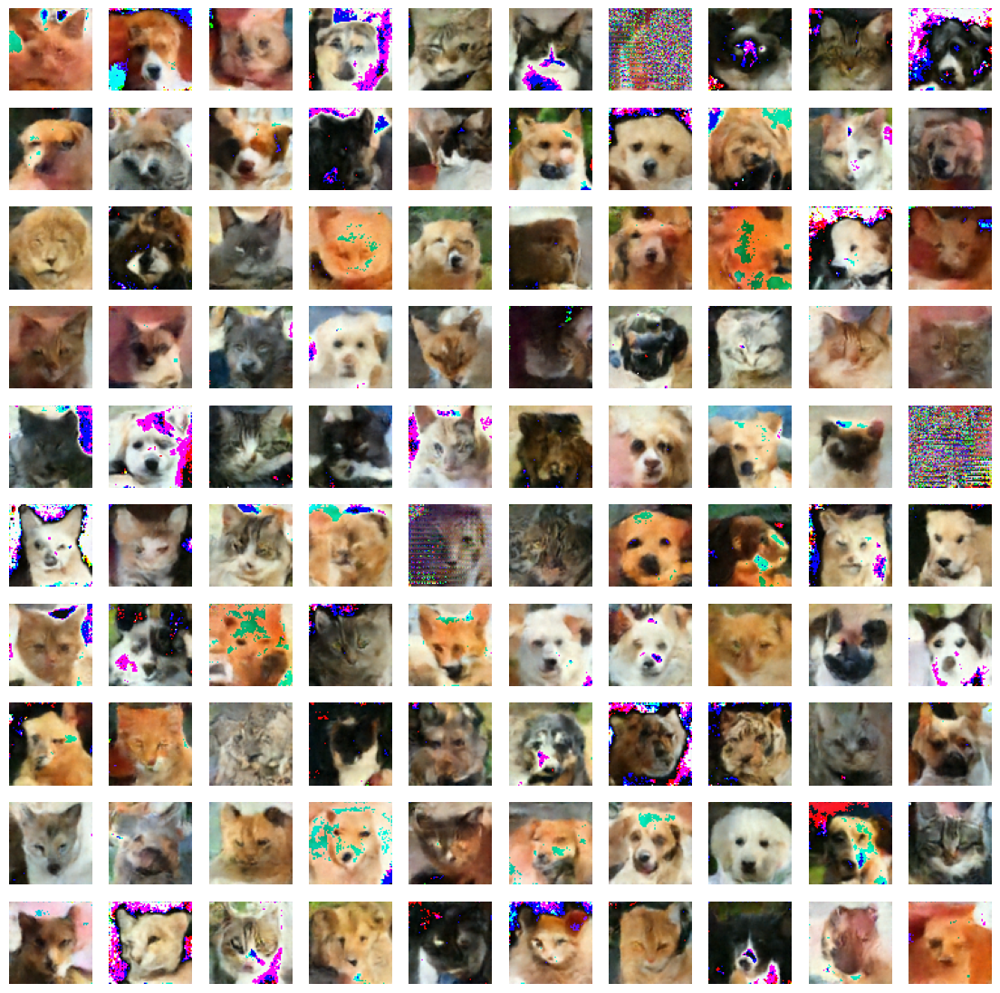

In [66]:
# generating 10x10 grid of images for T=1000
model.load_state_dict(torch.load('ddpm_models/100_ddpm_final.pt'))
model.eval()

def sample_timestep(x, t):
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

def sample_plot_image():
    img_size = IMG_SIZE
    plt.figure(figsize=(8,8))
    plt.axis('off')
    num_images = 1
    num_attempts = 100
    stepsize = int(T/num_images)

    for j in tqdm.tqdm(range(num_attempts), mininterval=10):
        img = torch.randn((1, 3, img_size, img_size), device=device)
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = sample_timestep(img, t)
        plt.subplot(10, 10, j+1)
        show_tensor_image(img.detach().cpu())
    plt.show()
    return 0

with torch.no_grad():
    sample_plot_image()

**Please Note**: For the purpose of this submission we have merged all the code into one file. Generating 10x10 grids for different backward inference times gives correct output when the below code cell is run in a separate execution session by changing the variable T value. If run concurrently with other backward inference time values in the same session of execution, it might give erraneous results. The below output has been compiled by running it in separate execution sessions.

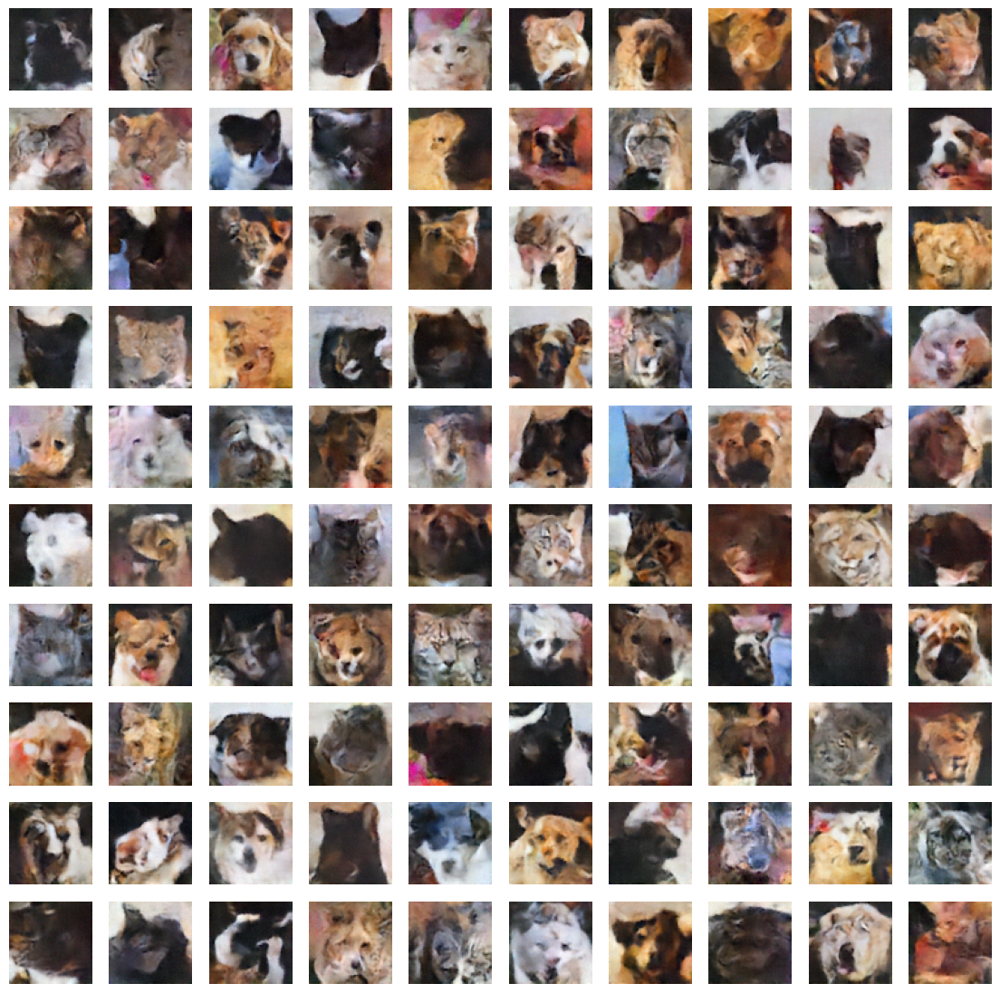

In [70]:
# generating 10x10 grid of images for T=1500
model.load_state_dict(torch.load('ddpm_models/100_ddpm_final_1500_steps.pt'))
model.eval()

with torch.no_grad():
    sample_plot_image()

**Please Note**: For the purpose of this submission we have merged all the code into one file. Generating 10x10 grids for different backward inference times gives correct output when the below code cell is run in a separate execution session by changing the variable T value. If run concurrently with other backward inference time values in the same session of execution, it might give erraneous results. The below output has been compiled by running it in separate execution sessions.

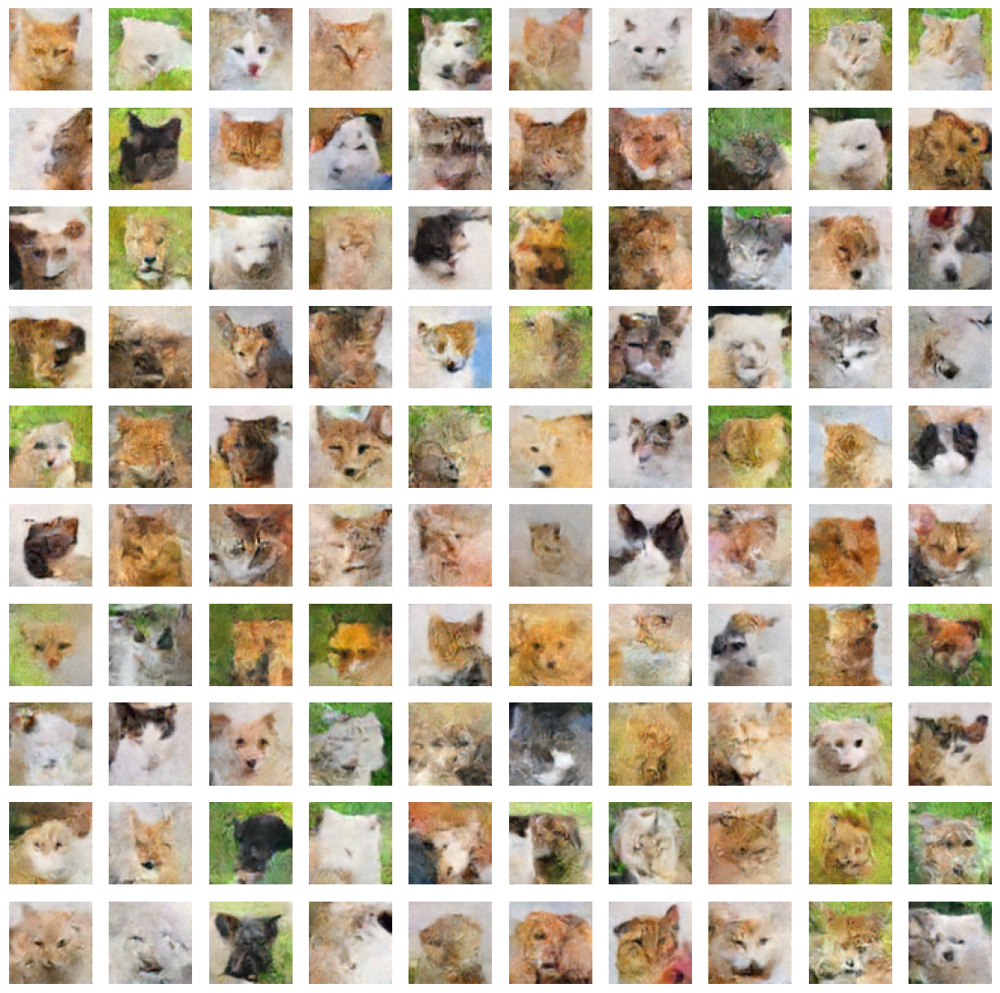

In [69]:
# generating 10x10 grid of images for T=2000
model.load_state_dict(torch.load('ddpm_models/100_ddpm_final_2000_steps.pt'))
model.eval()

with torch.no_grad():
    sample_plot_image()

#### FID Calculation

In [25]:
dataset_path = 'data/animals/afhq/'
batch_size = 1

In [26]:
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

fid_dataset = AnimalDataset(dataset_path, transform=transform)

fid_dataloader = DataLoader(fid_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

In [28]:
# store real images from dataset
output_directory = 'real_images/'
os.makedirs(output_directory, exist_ok=True)
image_counter = 0
for batch_idx, (real, _) in enumerate(fid_dataloader):
    images = real
    for image in images:
        save_image(image, os.path.join(output_directory, f'image_{image_counter:04d}.png'))
        image_counter += 1
    if image_counter >= 100:
        break

In [55]:
# store generated images for T=2000

def generate_images_ddpm(timestepT, num_images=100, normalize=True):

    def get_index_from_list(vals, t, x_shape):
        batch_size = t.shape[0]
        out = vals.gather(-1, t.cpu())
        return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)
    
    def sample_timestep(x, t):
        betas_t = get_index_from_list(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
        model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
        posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
        
        if t == 0:
            return model_mean
        else:
            noise = torch.randn_like(x)
            return model_mean + torch.sqrt(posterior_variance_t) * noise 

    def generate_image(model, timestepT):
        model.eval()
        T = timestepT
        img_size = IMG_SIZE

        img = torch.randn((1, 3, img_size, img_size), device=device)
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = sample_timestep(img, t)
        return img.detach().cpu()

    model_path = 'ddpm_models/100_ddpm_final_2000_steps.pt'
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    T = timestepT
    betas = linear_beta_schedule(timesteps=T)
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    output_dir = './generated_images_T2000'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for i in range(num_images):
        generated_image = generate_image(model, T).detach().cpu()
        save_image(generated_image, os.path.join(output_dir, f'generated_image_{i}.png'), normalize=normalize)
    print(f'Saved {num_images} generated images to {output_dir}')

generate_images_ddpm(timestepT=2000, num_images=100)

Saved 100 generated images to ./generated_images_T2000


In [60]:
# FID Calculation for T=2000
model_incep = inception_v3(pretrained=True, transform_input=False)
model_incep.eval()
fid_value = fid_score.calculate_fid_given_paths(['real_images/', 'generated_images_T2000/'], device='cuda', dims=2048, batch_size=16)
print(f"FID Score: {fid_value}")

100%|██████████| 7/7 [00:00<00:00, 25.79it/s]


FID Score: 246.60206541328708


In [56]:
# store generated images for T=1500

def generate_images_ddpm(timestepT, num_images=100, normalize=True):

    def get_index_from_list(vals, t, x_shape):
        batch_size = t.shape[0]
        out = vals.gather(-1, t.cpu())
        return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)
    
    def sample_timestep(x, t):
        betas_t = get_index_from_list(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
        model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
        posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
        
        if t == 0:
            return model_mean
        else:
            noise = torch.randn_like(x)
            return model_mean + torch.sqrt(posterior_variance_t) * noise 
    
    def generate_image(model, timestepT):
        model.eval()
        T = timestepT
        img_size = IMG_SIZE

        img = torch.randn((1, 3, img_size, img_size), device=device)
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = sample_timestep(img, t)
        return img.detach().cpu()

    model_path = 'ddpm_models/100_ddpm_final_1500_steps.pt'
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    T = timestepT
    betas = linear_beta_schedule(timesteps=T)
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    output_dir = './generated_images_T1500'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for i in range(num_images):
        generated_image = generate_image(model, T).detach().cpu()
        save_image(generated_image, os.path.join(output_dir, f'generated_image_{i}.png'), normalize=normalize)
    print(f'Saved {num_images} generated images to {output_dir}')

generate_images_ddpm(timestepT=1500, num_images=100)

Saved 100 generated images to ./generated_images_T1500


In [61]:
# FID Calculation for T=1500

model_incep = inception_v3(pretrained=True, transform_input=False)
model_incep.eval()
fid_value = fid_score.calculate_fid_given_paths(['real_images/', 'generated_images_T1500/'], device='cuda', dims=2048, batch_size=16)
print(f"FID Score: {fid_value}")

100%|██████████| 7/7 [00:00<00:00, 24.99it/s]


FID Score: 228.6277881167009


In [35]:
# store generated images for T=1000

def generate_images_ddpm(model, timestepT=1000, num_images=100, image_size=64, normalize=True):
    model_path = 'ddpm_models/100_ddpm_final.pt'
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    T = timestepT
    output_dir = './generated_images_T1000'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for i in range(num_images):
        generated_image = generate_image(model, T).detach().cpu()
        save_image(generated_image, os.path.join(output_dir, f'generated_image_{i}.png'), normalize=normalize)
    print(f'Saved {num_images} generated images to {output_dir}')

generate_images_ddpm(model, timestepT=1000, num_images=100, image_size=IMG_SIZE)

Saved 100 generated images to ./generated_images_T1000


In [59]:
# FID Calculation for T=1000

model_incep = inception_v3(pretrained=True, transform_input=False)
model_incep.eval()
fid_value = fid_score.calculate_fid_given_paths(['real_images/', 'generated_images_T1000/'], device='cuda', dims=2048, batch_size=16)
print(f"FID Score: {fid_value}")

/home/anish_a24/anaconda3/envs/imagebind/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/anish_a24/anaconda3/envs/imagebind/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 7/7 [00:00<00:00, 25.54it/s]


FID Score: 169.22214993514822


## Class conditional DDPM Implementation

## Procedure followed for Conditional Classification using Score based formulation [3]
1. Use the VAE of Assignment-1. Retrain it with an output latent dimension of 1024 (to get a square latent image of 1x32x32).
2. Use this VAE to write out the &#x03BC; for every input X. Unlike regular VAE, instead of sampling from a gaussion with this &#x03BC; as the mean, we get the &#x03BC;  directly as the Z for that X. Store all these Z's, along with the label of the X they came from, as a labelled dataframe for the next step.
3. Pre-train a classifier using these Zs and labels
4. Train a new DDPM using the Z using 1x32x32 as the dimension of the data. For subsequent steps, I will refer to these Z as the X's of this new DDPM.
5. In generation stage adjust the score of the unconditional generation with the gradient (w.r.t. Xt) of the output of the classifier for this Xt along. Mulitply with another hyperparameter CLASSIFIER_SCALE that gives us control over how much to prioritize the guidance coming from the classifier. Add this to the output of the original DDPM and proceed with the rest of the generation.
6. Once the final Xo is produced, pass it back through the decoder of the VAE to produce an image in the original data-space.

## Major Observations and Experiments
1. Classifier-guidance generation was tried on the original DDPM in the original data-space to test out the classifier. This showed that the classifier-guided generatation was working very well, since desired categories (cat, dog, wild) could be generated with high fidelity.
2. However, the same classifier-architecture when trained on the post-VAE-encoder latent space, and then used for DDPM-generatation with classifier-guidance, showed a noticeable drop in the classifier fidelity. Class=Dog could still be produced with very high fidelity, but Class=Cat was mixed. i.e. Classifier guidance based on Class=Cat tended to produce a high number of dogs/wild as well. 
3. One possible clue for above observation could be --> The inherent nature of the data-set. For instance, an unconditional-generation in the original data-space shows an expected mix of cat/dog/wild, but an unconditional generation in the latent-space (followed by decoding back to original data space) shows that the final output is heavily dominated by wild! 
4. One interesting observation was that, we dont necessarily have to use a positive mulitplier as the hyperparameter. A negative multiplier works as well, and as expected, pushes the generation away from that class. In fact, this negative guidance seems to actually work better than positive guidance! As in, asking the generation to NOT produce dogs, ends up producing cats with an extremely high fidelity! This is something worth exploring further. The downside with this approach (as can be seen in the images at the end of this notebook, is the loss of diversity in the generation.)
5. We experimented with different values for $\beta$ in $\beta$-VAE to see its effect on final conditional generation. There was no prior expectation on what to expect with higher or lower beta since higher beta means better segementation but it has no implication on the latent space's ability to segment the various types of images. Also lower beta means better reconstruction (which we indeed observed), but it did not produce any significant improvement to the conditional-guidance. Finally, we settled with Vanilla-VAE with $\beta$ = 1

In [1]:
## This cell contains all the package loads and the variable definitions
import os
import math
import sys
import warnings
import random
import time
import timeit
import tqdm
import numpy as np
from time import time
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
import torchvision
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torchvision.utils import save_image
import torchvision.utils as vutils
from torchvision import datasets
import matplotlib.pyplot as plt
import torch.backends.cudnn as cudnn
import pandas as pd
from sklearn.metrics import classification_report, precision_recall_fscore_support

# variables
#seed = 1823
latent_dim = 1024
learning_rate = 0.001
num_epochs = 20
cudnn.benchmark = True
input_channels = 3
num_epochs = 50
dataset_path = './data/animals/afhq'
IMG_SIZE = 64
BATCH_SIZE = 64
TRAIN = 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
latent_z_file = 'z_mean_beta1_vae_full.csv'
vae_model_file = 'z_mean_beta1_vae_full.pt'
classifier_model_file = 'z_mean_beta1_classifier_full.pt'
ddpm_model_file = 'z_mean_beta1_ddpm_vae_full.pt'
CLASSIFIER_SCALE = 2
BETA = 0.8

T = 1000
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)
betas = linear_beta_schedule(timesteps=T)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [2]:
## This cell just contains all the procs
class AnimalDataset(Dataset):
    def __init__(self, dataset_path, transform=None):
        self.dataset_path = os.path.join(dataset_path)
        self.transform = transform
        self.dataset_type = os.listdir(self.dataset_path)

        for i in range(len(self.dataset_type)):
            self.dataset_type[i] = os.path.join(self.dataset_path, self.dataset_type[i])

        self.class_names = [os.path.join(dtype, i) for dtype in self.dataset_type for i in os.listdir(dtype)]
        self.class_to_id = {class_name: i for i, class_name in enumerate(self.class_names)}
        self.data = []

        for class_name in self.class_names:
            for image in os.listdir(class_name):
                self.data.append((os.path.join(class_name, image), self.class_to_id[class_name]))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, id):
        image_path, label = self.data[id]
        image = Image.open(image_path)

        if self.transform:
            image = self.transform(image)

        return image, label

class MyDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        this = self.data[idx]
        z = this[:-1]
        z_t = torch.from_numpy(z).float()
        z_t = z_t.view(1,32,32)
        label = this[-1]
        if label == 0:
            temp = np.array([1,0,0], dtype=np.float32)
            new_label = torch.tensor(temp)
        if label == 1:
            temp = np.array([0,1,0], dtype=np.float32)
            new_label = torch.tensor(temp)
        if label == 2:
            temp = np.array([0,0,1], dtype=np.float32)
            new_label = torch.tensor(temp)    
        return z_t, new_label, label

class Encoder(nn.Module):
    def __init__(self, latent_dim):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 4, 2, 1)  # 32x32x32
        self.conv2 = nn.Conv2d(32, 64, 4, 2, 1)  # 64x16x16
        self.conv3 = nn.Conv2d(64, 128, 4, 2, 1)  # 128x8x8
        self.fc1 = nn.Linear(128 * 8 * 8, 2048)
        self.fc_mean = nn.Linear(2048, latent_dim)
        self.fc_logvar = nn.Linear(2048, latent_dim)
    
    def forward(self, x):
        x = F.leaky_relu(self.conv1(x))
        x = F.leaky_relu(self.conv2(x))
        x = F.leaky_relu(self.conv3(x))
        x = x.view(x.size(0), -1)
        x = F.leaky_relu(self.fc1(x))
        mean = self.fc_mean(x)
        logvar = self.fc_logvar(x)
        return mean, logvar
    
class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim, 2048) 
        self.fc2 = nn.Linear(2048, 256 * 16 * 16) # 1x65536
        self.deconv2 = nn.ConvTranspose2d(256, 128, 4, 2, 1) # 128x32x32
        self.deconv3 = nn.ConvTranspose2d(128, 64, 4, 2, 1) # 64x64x64
        self.deconv4 = nn.ConvTranspose2d(64, 3, 3, 1, 1) # 3x64x64
    
    def forward(self, z):
        x = F.leaky_relu(self.fc1(z))
        x = F.leaky_relu(self.fc2(x))
        x = x.view(x.size(0), 256, 16, 16)
        x = F.leaky_relu(self.deconv2(x))
        x = F.leaky_relu(self.deconv3(x))
        x = torch.sigmoid(self.deconv4(x))
        return x
    
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        self.encoder = Encoder(latent_dim)
        self.decoder = Decoder(latent_dim)
    
    def reparameterize(self, mean, logvar):
        std = torch.exp(0.5 * logvar)
        epsilon = torch.randn_like(std)
        return mean + epsilon * std
    
    def forward(self, x):
        mean, logvar = self.encoder(x)
        z = self.reparameterize(mean, logvar)
        x_reconstructed = self.decoder(z)
        return x_reconstructed, mean, logvar

def vae_loss(x_reconstructed, x, mean, logvar):
    likelihood_loss = F.mse_loss(x_reconstructed, x, reduction='sum')
    kl_divergence_loss = -0.5 * torch.sum(1 + logvar - mean.pow(2) - logvar.exp())
    return likelihood_loss + BETA * kl_divergence_loss, likelihood_loss.item(), kl_divergence_loss.item()

# function to display generated images from latent space in a 10x10 grid
def display_generated_images(vae, epoch):
    n_samples = 100
    with torch.no_grad():
        z_samples = torch.randn(n_samples, latent_dim).to(device)
    generated_images = vae.decoder(z_samples).to(device)
    grid = vutils.make_grid(generated_images, nrow=10, normalize=True, padding=5, pad_value=1)
    plt.figure(figsize=(10, 10))
    plt.axis("off")
    plt.title("Generated Images (Epoch {})".format(epoch))
    plt.imshow(grid.permute(1, 2, 0).cpu())
    plt.show()

# Define the CNN model
class ZClassifier_CNN(nn.Module):
    def __init__(self):
        super().__init__()
        ## Input = 32 x 32 x 1
        # Convolutional layers
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, stride=1)
        ## 64 x 30 x 30
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        ## 64 x 15 x 15
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        ## 128 x 15 x 15
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        ## 128 x 7 x 7
        # Fully connected layers
        self.flatten = nn.Flatten()
        ## 6272 = 128 x 7 x 7
        self.fc1 = nn.Linear(6272, 64)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(64, 3)

    def forward(self, x):
        # Pass the input through the convolutional layers
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.maxpool1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.maxpool2(x)
        # Flatten the output of the convolutional layers
        x = self.flatten(x)
        # Pass the flattened output through the fully connected layers
        x = self.fc1(x)
        x = self.relu3(x)
        x = self.fc2(x)
        return x
    
class MyDataset_DV(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        this = self.data[idx]
        z = this[:-1]
        z_t = torch.from_numpy(z).float()
        z_t = z_t.view(1,32,32)
        label = this[-1]
        return z_t, label
    
def get_index_from_list(vals, t, x_shape):
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: t.permute(1, 2, 0)),
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])
    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))
    plt.axis('off')
    return 0

class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        h = self.bnorm1(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm2(self.relu(self.conv2(h)))
        return self.transform(h)

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class ZUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 1
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1
        time_emb_dim = 32
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)
    
def forward_diffusion_sample(x_0, t, device="cpu"):
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

def sample_timestep_with_cond(ddpm, classifier, x, t, y):
    betas_t = get_index_from_list(betas, t, x.shape)
    with torch.enable_grad():
        x = x.detach().requires_grad_(True)
        logits = classifier(x)
        log_probs = F.log_softmax(logits, dim=-1)
        selected = log_probs[range(len(logits)), y.view(-1)]
        grad = torch.autograd.grad(selected.sum(), x)[0]
    eps = ddpm(x,t)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    eps_shifted = eps - sqrt_one_minus_alphas_cumprod_t * grad * CLASSIFIER_SCALE
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * eps_shifted / sqrt_one_minus_alphas_cumprod_t)
    ## Old: model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

def sample_plot_image_with_cond(ddpm, classifier, vae, y):
    img_size = 32
    ## If running on original X space, then change img_size to 64 or 128

    plt.figure(figsize=(8,8))
    plt.axis('off')
    num_attempts = 100

    for j in tqdm.tqdm(range(num_attempts), mininterval=10):
        img = torch.randn((1, 1, img_size, img_size), device=device)
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = sample_timestep_with_cond(ddpm, classifier, img, t, y)
            z_for_vae = img.view(1, 1, 1024)
            x_reconstructed = vae.decoder(z_for_vae)
        plt.subplot(10,10, j+1)
        show_tensor_image(x_reconstructed.detach().cpu())
    plt.show()
    return 0

In [3]:
## This cell trains the VAE afresh
vae = VAE(latent_dim).to(device)
optimizer = optim.Adam(vae.parameters(), lr=learning_rate)
total_loss_list = []
likelihood_loss_list = []
kl_div_loss_list = []
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()])
train_dataset = AnimalDataset(dataset_path, transform=transform)
dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
# Training loop for VAE
for epoch in range(100):
    vae.train()
    total_loss = 0
    likelihood_loss = 0
    kl_div_loss = 0
    start_time = time()
    for batch_idx, (data, _) in enumerate(dataloader):
        data = data.to(device)
        x_reconstructed, mean, logvar = vae(data)
        loss, lkd_loss, kld_loss = vae_loss(x_reconstructed, data, mean, logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        likelihood_loss += lkd_loss
        kl_div_loss += kld_loss
    end_time = time()
    epoch_time = end_time - start_time

    appended_total_loss = total_loss / len(dataloader.dataset)
    appended_likelihood_loss = likelihood_loss / len(dataloader.dataset)
    appended_kl_div_loss = kl_div_loss / len(dataloader.dataset)

    total_loss_list.append(appended_total_loss)
    likelihood_loss_list.append(appended_likelihood_loss)
    kl_div_loss_list.append(appended_kl_div_loss)

    print(f"Epoch [{epoch + 1}/{num_epochs}], Total Loss: {appended_total_loss:.4f}, Likelihood loss: {appended_likelihood_loss:.4f}, KL Loss: {appended_kl_div_loss:.4f} Time: {epoch_time:.2f} seconds")

torch.save(vae.state_dict(), vae_model_file)

Epoch [1/50], Total Loss: 514.4816, Likelihood loss: 499.5267, KL Loss: 18.6936 Time: 142.25 seconds
Epoch [2/50], Total Loss: 403.5727, Likelihood loss: 378.5698, KL Loss: 31.2537 Time: 71.86 seconds
Epoch [3/50], Total Loss: 371.7620, Likelihood loss: 340.9259, KL Loss: 38.5451 Time: 68.76 seconds
Epoch [4/50], Total Loss: 359.2172, Likelihood loss: 325.7857, KL Loss: 41.7894 Time: 71.06 seconds
Epoch [5/50], Total Loss: 350.4843, Likelihood loss: 315.3937, KL Loss: 43.8632 Time: 69.21 seconds
Epoch [6/50], Total Loss: 340.0876, Likelihood loss: 303.0998, KL Loss: 46.2347 Time: 69.64 seconds
Epoch [7/50], Total Loss: 334.0059, Likelihood loss: 295.6345, KL Loss: 47.9643 Time: 69.32 seconds
Epoch [8/50], Total Loss: 327.0689, Likelihood loss: 288.0779, KL Loss: 48.7388 Time: 70.02 seconds
Epoch [9/50], Total Loss: 318.4777, Likelihood loss: 280.2892, KL Loss: 47.7357 Time: 69.50 seconds
Epoch [10/50], Total Loss: 306.4083, Likelihood loss: 270.1063, KL Loss: 45.3775 Time: 71.62 second

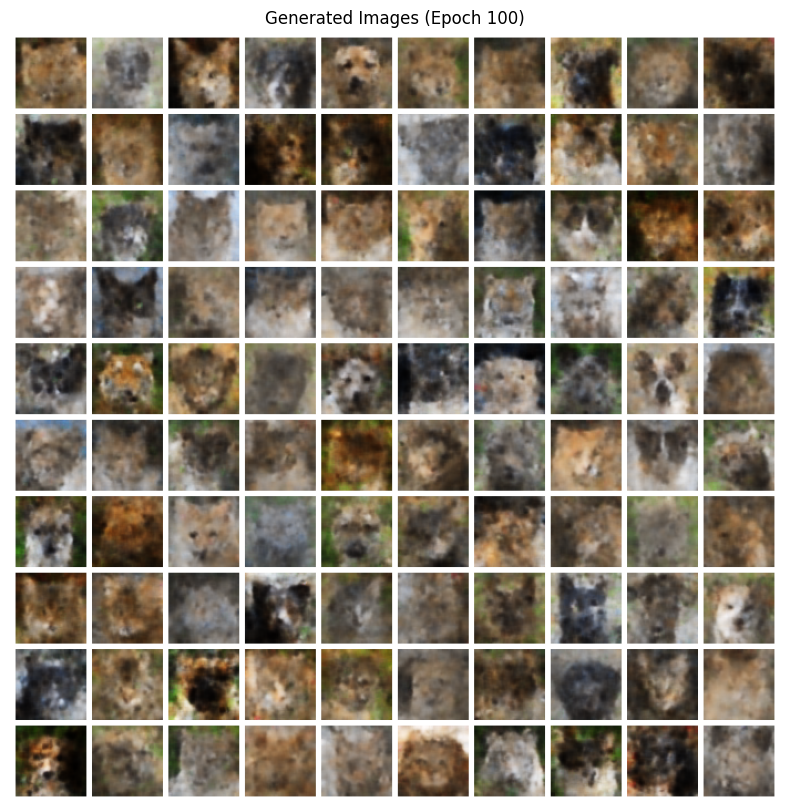

16130it [01:04, 251.74it/s]


In [4]:
## This cell is to write the latent Z from the trained VAE-encoder
# vae = VAE(latent_dim).to(device)
# vae.load_state_dict(torch.load(vae_model_file))
vae.eval()
display_generated_images(vae, 100)
single_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)
dataframe = []
for batch_idx, (data, label) in tqdm.tqdm(enumerate(single_dataloader), mininterval=30):
    data = data.to(device)
    mean, logvar = vae.encoder(data)
    ##std = torch.exp(0.5 * logvar)
    ##epsilon = torch.randn_like(std)
    ##z =  mean + epsilon * std
    z = mean
    z = z.reshape(-1)
    z = z.cpu()
    z_n = z.detach().numpy()
    z_n = np.append(z_n, label)
    dataframe.append(z_n)
np.savetxt(latent_z_file, dataframe, delimiter=',')

In [24]:
## This cell is the train the classifier on the VAE-encoder-output-latent
BATCH_SIZE = 128
learning_rate = 0.0002
latent_dim = 1024
input_img_dim = 32
input_channels = 1
num_epochs = 50
IMG_SIZE = 32

df = pd.read_csv(latent_z_file, header=None)
last_column_name = df.columns[-1]
df.rename(columns={last_column_name: 'label'}, inplace=True)
search_item = 3
replace_item = 0
df['label'].replace(search_item, replace_item, inplace=True)
search_item = 4
replace_item = 1
df['label'].replace(search_item, replace_item, inplace=True)
search_item = 5
replace_item = 2
df['label'].replace(search_item, replace_item, inplace=True)
data = df.to_numpy()

dataset = MyDataset(data)
# Split the dataset
train_size = int(0.99 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
# Create training and validation dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False)

classifier = ZClassifier_CNN().to(device)
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier.parameters(), lr=learning_rate)

# Train the model
for epoch in range(num_epochs):
    for i, (images, labels, _) in enumerate(train_dataloader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        outputs = classifier(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch + 1, num_epochs, i + 1, len(train_dataloader), loss.item()))
torch.save(classifier.state_dict(), classifier_model_file)

# Test the model after every epoch
classifier.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for images, _ , scalar_labels in test_dataloader:
        images = images.to(device)
        scalar_labels = scalar_labels.to(device)
        outputs = classifier(images)
        _, preds = torch.max(outputs.data, 1)
        y_true.append(scalar_labels.cpu().numpy().item())
        y_pred.append(preds.cpu().numpy().item())
# Get classification report
print(classification_report(y_true, y_pred))
precision, recall, f1_score, support = precision_recall_fscore_support(y_true, y_pred)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
print("Support:", support)

Epoch [1/50], Step [125/125], Loss: 0.8279
Epoch [2/50], Step [125/125], Loss: 0.5715
Epoch [3/50], Step [125/125], Loss: 0.6127
Epoch [4/50], Step [125/125], Loss: 0.5769
Epoch [5/50], Step [125/125], Loss: 0.7113
Epoch [6/50], Step [125/125], Loss: 0.5979
Epoch [7/50], Step [125/125], Loss: 0.5723
Epoch [8/50], Step [125/125], Loss: 0.4743
Epoch [9/50], Step [125/125], Loss: 0.6135
Epoch [10/50], Step [125/125], Loss: 0.6094
Epoch [11/50], Step [125/125], Loss: 0.6590
Epoch [12/50], Step [125/125], Loss: 0.5457
Epoch [13/50], Step [125/125], Loss: 0.6450
Epoch [14/50], Step [125/125], Loss: 0.5441
Epoch [15/50], Step [125/125], Loss: 0.5956
Epoch [16/50], Step [125/125], Loss: 0.6023
Epoch [17/50], Step [125/125], Loss: 0.7236
Epoch [18/50], Step [125/125], Loss: 0.5205
Epoch [19/50], Step [125/125], Loss: 0.5050
Epoch [20/50], Step [125/125], Loss: 0.3430
Epoch [21/50], Step [125/125], Loss: 0.4842
Epoch [22/50], Step [125/125], Loss: 0.4861
Epoch [23/50], Step [125/125], Loss: 0.42

In [6]:
## This cell is run to DDPM training on the VAE-encoder-output-latent
BATCH_SIZE = 64
learning_rate = 2e-4
latent_dim = 1024
input_img_dim = 32
input_channels = 1
num_epochs = 100
IMG_SIZE = 32

df = pd.read_csv(latent_z_file, header=None)
last_column_name = df.columns[-1]
df.rename(columns={last_column_name: 'label'}, inplace=True)
search_item = 3
replace_item = 0
df['label'].replace(search_item, replace_item, inplace=True)
search_item = 4
replace_item = 1
df['label'].replace(search_item, replace_item, inplace=True)
search_item = 5
replace_item = 2
df['label'].replace(search_item, replace_item, inplace=True)
data = df.to_numpy()

dataset = MyDataset_DV(data)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
ddpm = ZUnet().to(device)
classifier = ZClassifier_CNN().to(device)
vae = VAE(latent_dim).to(device)
optimizer = optim.Adam(ddpm.parameters(), lr=0.001)
print('Starting training')
for epoch in range(num_epochs):
    total_loss = 0.0
    for batch_idx, (image, _) in tqdm.tqdm(enumerate(dataloader), mininterval=30):
        t = torch.randint(0, T, (image.shape[0],), device=device).long()
        loss = get_loss(ddpm, image, t)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}] \t Loss: {total_loss}")
torch.save(ddpm.state_dict(), ddpm_model_file)

Starting training


253it [00:41,  6.12it/s]


Epoch [1/100] 	 Loss: 36.18953501433134


253it [00:36,  6.88it/s]


Epoch [2/100] 	 Loss: 22.35228994488716


253it [00:36,  6.87it/s]


Epoch [3/100] 	 Loss: 20.02401725947857


253it [00:37,  6.83it/s]


Epoch [4/100] 	 Loss: 19.469508677721024


253it [00:36,  6.86it/s]


Epoch [5/100] 	 Loss: 19.072659503668547


253it [00:38,  6.57it/s]


Epoch [6/100] 	 Loss: 18.357947327196598


253it [00:40,  6.27it/s]


Epoch [7/100] 	 Loss: 18.54157903790474


253it [00:39,  6.47it/s]


Epoch [8/100] 	 Loss: 17.922762494534254


253it [00:36,  6.85it/s]


Epoch [9/100] 	 Loss: 18.50573204085231


253it [00:36,  6.86it/s]


Epoch [10/100] 	 Loss: 17.28376004472375


253it [00:36,  6.87it/s]


Epoch [11/100] 	 Loss: 16.49527818337083


253it [00:36,  6.86it/s]


Epoch [12/100] 	 Loss: 16.107558637857437


253it [00:36,  6.86it/s]


Epoch [13/100] 	 Loss: 15.832775339484215


253it [00:36,  6.86it/s]


Epoch [14/100] 	 Loss: 15.630196690559387


253it [00:36,  6.86it/s]


Epoch [15/100] 	 Loss: 14.89341926947236


253it [00:36,  6.87it/s]


Epoch [16/100] 	 Loss: 14.996270321309566


253it [00:36,  6.86it/s]


Epoch [17/100] 	 Loss: 14.593367714434862


253it [00:36,  6.86it/s]


Epoch [18/100] 	 Loss: 14.790903870016336


253it [00:36,  6.87it/s]


Epoch [19/100] 	 Loss: 14.65656839683652


253it [00:36,  6.86it/s]


Epoch [20/100] 	 Loss: 14.411894220858812


253it [00:37,  6.84it/s]


Epoch [21/100] 	 Loss: 14.912525847554207


253it [00:37,  6.83it/s]


Epoch [22/100] 	 Loss: 14.626916240900755


253it [00:36,  6.86it/s]


Epoch [23/100] 	 Loss: 14.306397281587124


253it [00:37,  6.83it/s]


Epoch [24/100] 	 Loss: 13.811364620923996


253it [00:37,  6.83it/s]


Epoch [25/100] 	 Loss: 14.186532691121101


253it [00:37,  6.83it/s]


Epoch [26/100] 	 Loss: 14.009898524731398


253it [00:36,  6.84it/s]


Epoch [27/100] 	 Loss: 14.011736199259758


253it [00:36,  6.84it/s]


Epoch [28/100] 	 Loss: 18.20454692468047


253it [00:36,  6.86it/s]


Epoch [29/100] 	 Loss: 14.425498746335506


253it [00:36,  6.85it/s]


Epoch [30/100] 	 Loss: 14.14402961730957


253it [00:36,  6.85it/s]


Epoch [31/100] 	 Loss: 13.992677941918373


253it [00:36,  6.86it/s]


Epoch [32/100] 	 Loss: 13.819555938243866


253it [00:36,  6.85it/s]


Epoch [33/100] 	 Loss: 13.422215461730957


253it [00:36,  6.85it/s]


Epoch [34/100] 	 Loss: 13.803070794790983


253it [00:36,  6.85it/s]


Epoch [35/100] 	 Loss: 13.516686011105776


253it [00:36,  6.85it/s]


Epoch [36/100] 	 Loss: 13.354416534304619


253it [00:36,  6.86it/s]


Epoch [37/100] 	 Loss: 13.368306513875723


253it [00:36,  6.86it/s]


Epoch [38/100] 	 Loss: 13.426858473569155


253it [00:36,  6.86it/s]


Epoch [39/100] 	 Loss: 13.520193599164486


253it [00:36,  6.85it/s]


Epoch [40/100] 	 Loss: 13.114356506615877


253it [00:36,  6.85it/s]


Epoch [41/100] 	 Loss: 13.611132182180882


253it [00:36,  6.86it/s]


Epoch [42/100] 	 Loss: 13.272885877639055


253it [00:36,  6.85it/s]


Epoch [43/100] 	 Loss: 13.08806923404336


253it [00:36,  6.86it/s]


Epoch [44/100] 	 Loss: 13.246209923177958


253it [00:36,  6.85it/s]


Epoch [45/100] 	 Loss: 13.204499043524265


253it [00:36,  6.85it/s]


Epoch [46/100] 	 Loss: 13.209082309156656


253it [00:37,  6.81it/s]


Epoch [47/100] 	 Loss: 12.869868371635675


253it [00:37,  6.70it/s]


Epoch [48/100] 	 Loss: 12.927341397851706


253it [00:37,  6.83it/s]


Epoch [49/100] 	 Loss: 13.109111834317446


253it [00:37,  6.82it/s]


Epoch [50/100] 	 Loss: 12.532061334699392


253it [00:37,  6.72it/s]


Epoch [51/100] 	 Loss: 12.721389546990395


253it [00:36,  6.85it/s]


Epoch [52/100] 	 Loss: 13.058415692299604


253it [00:37,  6.83it/s]


Epoch [53/100] 	 Loss: 12.880513403564692


253it [00:36,  6.85it/s]


Epoch [54/100] 	 Loss: 12.892659187316895


253it [00:37,  6.81it/s]


Epoch [55/100] 	 Loss: 13.182644920423627


253it [00:37,  6.83it/s]


Epoch [56/100] 	 Loss: 12.558474123477936


253it [00:36,  6.85it/s]


Epoch [57/100] 	 Loss: 12.953621573746204


253it [00:36,  6.86it/s]


Epoch [58/100] 	 Loss: 12.594678703695536


253it [00:36,  6.84it/s]


Epoch [59/100] 	 Loss: 12.573826435953379


253it [00:36,  6.84it/s]


Epoch [60/100] 	 Loss: 12.765184853225946


253it [00:36,  6.84it/s]


Epoch [61/100] 	 Loss: 12.530006930232048


253it [00:36,  6.84it/s]


Epoch [62/100] 	 Loss: 12.812017675489187


253it [00:36,  6.85it/s]


Epoch [63/100] 	 Loss: 12.751574531197548


253it [00:37,  6.83it/s]


Epoch [64/100] 	 Loss: 12.551107112318277


253it [00:36,  6.85it/s]


Epoch [65/100] 	 Loss: 12.683237724006176


253it [00:36,  6.86it/s]


Epoch [66/100] 	 Loss: 12.578587736934423


253it [00:37,  6.83it/s]


Epoch [67/100] 	 Loss: 12.40975920110941


253it [00:36,  6.85it/s]


Epoch [68/100] 	 Loss: 12.39062962681055


253it [00:36,  6.85it/s]


Epoch [69/100] 	 Loss: 12.320227108895779


253it [00:36,  6.85it/s]


Epoch [70/100] 	 Loss: 12.38173459470272


253it [00:36,  6.86it/s]


Epoch [71/100] 	 Loss: 12.4479864500463


253it [00:36,  6.85it/s]


Epoch [72/100] 	 Loss: 12.152812749147415


253it [00:37,  6.83it/s]


Epoch [73/100] 	 Loss: 12.329688783735037


253it [00:37,  6.76it/s]


Epoch [74/100] 	 Loss: 12.410198686644435


253it [00:36,  6.85it/s]


Epoch [75/100] 	 Loss: 12.424063168466091


253it [00:37,  6.79it/s]


Epoch [76/100] 	 Loss: 12.46711714938283


253it [00:37,  6.84it/s]


Epoch [77/100] 	 Loss: 12.361216176301241


253it [00:36,  6.85it/s]


Epoch [78/100] 	 Loss: 12.163698926568031


253it [00:36,  6.86it/s]


Epoch [79/100] 	 Loss: 12.295211471617222


253it [00:37,  6.83it/s]


Epoch [80/100] 	 Loss: 12.426092114299536


253it [00:37,  6.84it/s]


Epoch [81/100] 	 Loss: 12.355966653674841


253it [00:36,  6.85it/s]


Epoch [82/100] 	 Loss: 12.301136814057827


253it [00:37,  6.81it/s]


Epoch [83/100] 	 Loss: 12.516982570290565


253it [00:36,  6.84it/s]


Epoch [84/100] 	 Loss: 12.24874359741807


253it [00:37,  6.83it/s]


Epoch [85/100] 	 Loss: 12.050598738715053


253it [00:36,  6.86it/s]


Epoch [86/100] 	 Loss: 12.11823071911931


253it [00:36,  6.85it/s]


Epoch [87/100] 	 Loss: 12.179214552044868


253it [00:37,  6.80it/s]


Epoch [88/100] 	 Loss: 12.250596649944782


253it [00:36,  6.85it/s]


Epoch [89/100] 	 Loss: 11.911133632063866


253it [00:37,  6.83it/s]


Epoch [90/100] 	 Loss: 12.222096238285303


253it [00:36,  6.85it/s]


Epoch [91/100] 	 Loss: 11.926285967230797


253it [00:36,  6.85it/s]


Epoch [92/100] 	 Loss: 11.939084108918905


253it [00:37,  6.80it/s]


Epoch [93/100] 	 Loss: 12.167258746922016


253it [00:36,  6.86it/s]


Epoch [94/100] 	 Loss: 11.917201116681099


253it [00:36,  6.84it/s]


Epoch [95/100] 	 Loss: 11.93223361670971


253it [00:37,  6.84it/s]


Epoch [96/100] 	 Loss: 12.005534134805202


253it [00:36,  6.84it/s]


Epoch [97/100] 	 Loss: 12.042321566492319


253it [00:36,  6.85it/s]


Epoch [98/100] 	 Loss: 12.085111901164055


253it [00:36,  6.86it/s]


Epoch [99/100] 	 Loss: 12.115423103794456


253it [00:36,  6.84it/s]


Epoch [100/100] 	 Loss: 12.146301999688148


### DDPM Inference/Generation

Generated images - UNCONDITIONAL


100%|██████████| 100/100 [22:50<00:00, 13.70s/it]


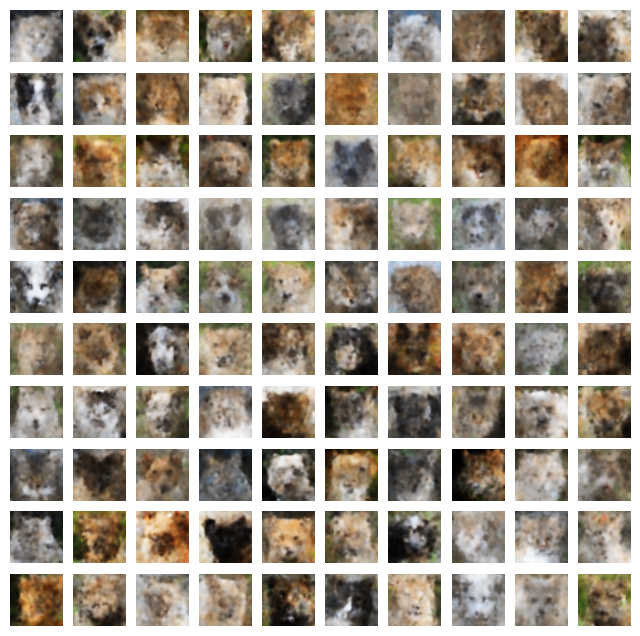



Generated images - CLASS CONDITIONAL for Class=Cat


100%|██████████| 100/100 [22:45<00:00, 13.65s/it]


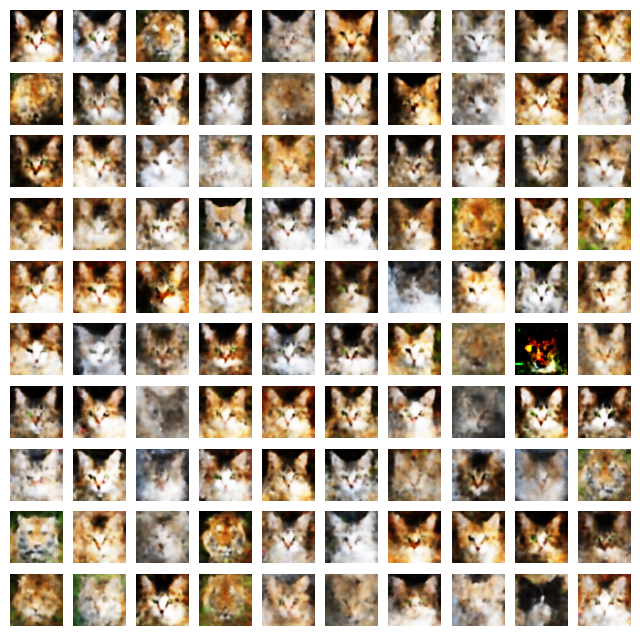



Generated images - CLASS CONDITIONAL for Class=Dog


100%|██████████| 100/100 [22:53<00:00, 13.73s/it]


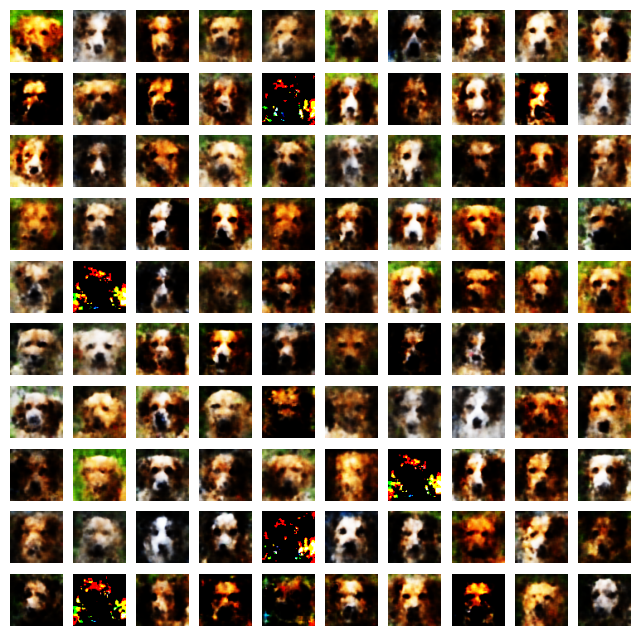



Generated images - CLASS CONDITIONAL for Class=Wild


100%|██████████| 100/100 [22:47<00:00, 13.68s/it]


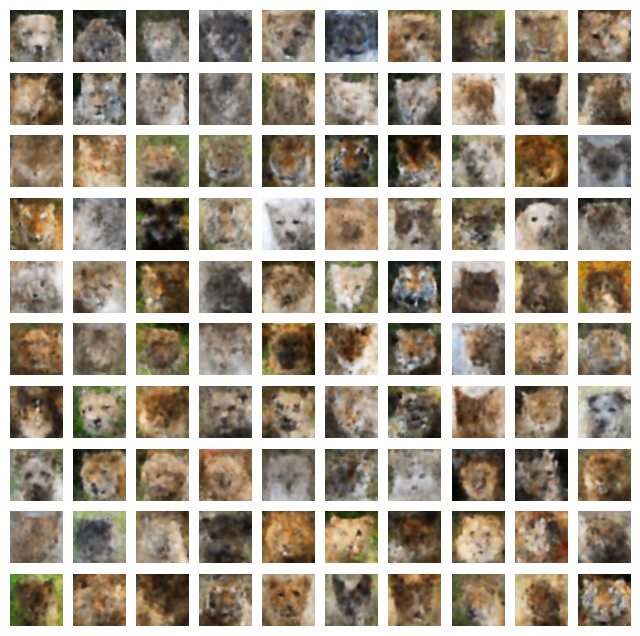

In [5]:
## This cell is run to DDPM inference/generation
vae = VAE(latent_dim).to(device)
ddpm = ZUnet().to(device)
classifier = ZClassifier_CNN().to(device)

ddpm.load_state_dict(torch.load(ddpm_model_file))
classifier.load_state_dict(torch.load(classifier_model_file))
vae.load_state_dict(torch.load(vae_model_file))
ddpm.eval()
classifier.eval()
vae.eval()
## cat = 0  dog = 1  wild = 2
with torch.no_grad():
    ## Without classification
    print("\033[1m\033[31mGenerated images - UNCONDITIONAL\033[0m")
    y = torch.tensor(0, dtype=torch.long, device=device)
    y = y.int()
    CLASSIFIER_SCALE = 0
    sample_plot_image_with_cond(ddpm, classifier, vae, y)

    ## cat = 0
    print('\n')
    print("\033[1m\033[31mGenerated images - CLASS CONDITIONAL for Class=Cat\033[0m")
    y = torch.tensor(1, dtype=torch.long, device=device)
    y = y.int()
    CLASSIFIER_SCALE = -2
    sample_plot_image_with_cond(ddpm, classifier, vae, y)

    ## dog = 1
    print('\n')
    print("\033[1m\033[31mGenerated images - CLASS CONDITIONAL for Class=Dog\033[0m")
    y = torch.tensor(0, dtype=torch.long, device=device)
    y = y.int()
    CLASSIFIER_SCALE = -2
    sample_plot_image_with_cond(ddpm, classifier, vae, y)

    ## wild = 2
    print('\n')
    print("\033[1m\033[31mGenerated images - CLASS CONDITIONAL for Class=Wild\033[0m")
    y = torch.tensor(2, dtype=torch.long, device=device)
    y = y.int()
    CLASSIFIER_SCALE = 4
    sample_plot_image_with_cond(ddpm, classifier, vae, y)

## 2. Momentum Contrast Encoder

**Problem 2:** Implement Self-supervised learning using Momentum Contrast Encoder method (MoCO). Try 3 sets of augmentation methods. Implement a linear classifier on the learnt representations. Compare it witha full-blown CNN, that has the same number of parameters. Record the reduction in the amount of supervised data needed

### 2.1. MOCO Based Classifier ####

We train a MoCo Model with Animal Dataset. We consider 3 different types of data augmentations- rotations, cropping and color distortion -2 at a time for defining the positive samples. 
We then use the entire 40 % of the training data to learn the representations. Once the representations are learned, we then imaplement a linear layer on the 60% of supervised training data and compare the
results with the base CNN model implemented before.


### 2.2. CNN Based Classifier ####

We train a CNN Model with Animal Dataset. Here we are using Resnet-18 along with a linear layer. We are unsing the same number of total ;ayers as in the moco model to get a better idea pf performance of moco-based classifier v/s cnn-based classifier. We have fixed 80 % opf the data to be used for training and the rest 20% for testing.

### 2.3. MOCO Based-Model Architecture ####

MoCo falls under the class of unsupervised visual representational learning based on contrastive learning. On a high level, the model trains a visual representational encoder matching an encoded
query q to a dictionary of encoded keys using a contrastive loss. The dictionary keys {k0, k1, k2, ...} are defined on-the-fly by a set of data samples. The dictionary is built as a queue, with the current
mini-batch enqueued and the oldest mini-batch dequeued, decoupling it from the mini-batch size.The keys are encoded by a slowly progressing encoder, driven by a momentum update with the query
encoder. This method enables a large and consistent dictionary for learning visual representations.


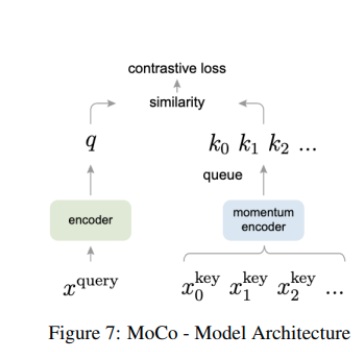

 ### 2.4. Training and Hyperparameters ####
 We train the model on the same Animal dataset for 2 epochs, with batch size of 1000. For the encoder architecture, we used the Resnet-18 model as mentioned in the paper. We resize the images to 128 x 128 x 3 and train the encoder, which is also used as different representations. For generating the positive samples, we augment the images like adding Rotation, color change and crop using 2 at a time - one for augmenting the input image for the query encoder and one for augmenting the input imnage for the key encoder.



#### 2.4.1. For MoCO #####
1.The queue size used in the dictionary is 5000, and the momentum coefficient is set to 0.9999. 
2.With these hyper parameters, we train the encoder model. The loss function used is a cross entropy loss. We use SGD Optimizer. 
3.While backpropagating, the momentum encoder is not trained the usual way, rather we perform momentum update based on the encoder weights.
4.We use augment_mode_query and augment_mode_key as the hyperparameters to define the augmentation mode for the query and the key paramters and we performed experiments on the 6 combinations
5.We are using the temperature of 0.07 as mentioned in the reference paper.
6. We are using moco_train_ratio as the hyperparameter to decide thje amount of data to be ised for unsepervised training. While 1-moco_train_ratio will be used for training.




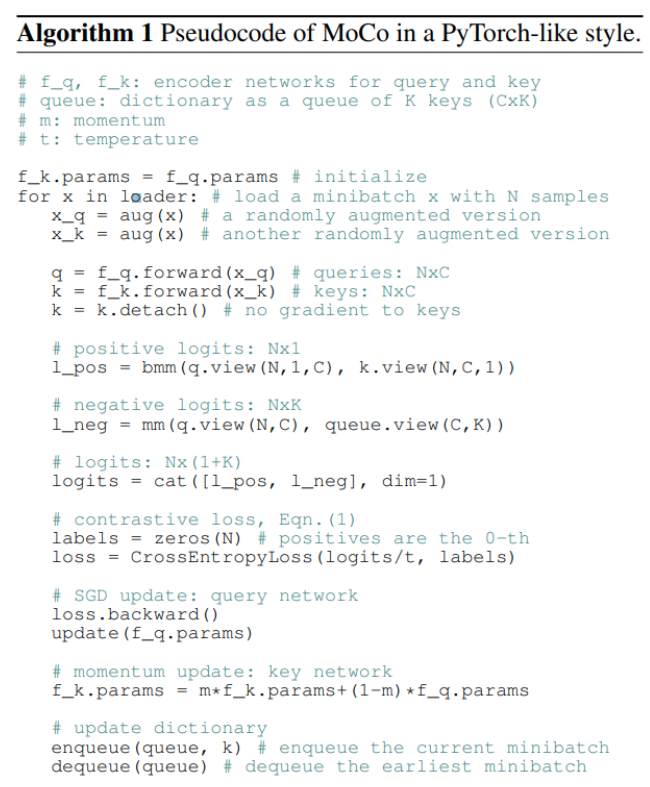

### 2.5. Experiments & Results/Observations ####

 We are training the moco model only once (unsupervised) while training on the linear classifier for 2 epochs. Note that die to computational constrainsts we are limiting the number of epochs we are running for.
 We are training the CNN model for 50 epochs.It is easily evident how the MOC classifer performs better than its CNN counter part just by looking at the initial epoch training accuracies. 

CNN Classfiier training accuracy : 35.59 % is used as the base against which all other experiments are compared. CNN classfier is trained for 50 epochs.
We are taking 80 % if the Animal dataset for CNN classifier.

moco_train_ratio : ratio of total data used for moco unsupervision task.
The rest is used for moco supervised training

eg if moco_train_ratio =0.2 this means that only 20 percent of the entire Animal dataset is being utlisied to train moco (unsupervised) while the rest 80 percent will be utlised to train the supervised fine tuning. 
We are comparing the training accuracies of MOCO based classifer and the CNN based classifier.

The experiments done can be considered as a detailed answer to the question posed in the assignment  "Compare it with a full-blown CNN, that has the same number of parameters. Record the
 in the amount of supervised data needed."



### Experiments #### 
Out of the three hyperparameters, we will be fixing two (augmenation styles) and varying the moco_train_ratio (or the amount of unsupervised data used for moco training) to see respective univariate change in the moco model.



#### A.&nbsp;Fixed Hyperparamters: augment_mode_query="crop" ,augment_mode_key="color-change"&nbsp;Varying Hyperparameters : moco_train_ratio


|moco_train_ratio | MOCO Classfier Training accuracy |
|-----------------------| ---------------------------|
 |    0.2       |  38.3% |
 |    0.4        |    39.2% |
  |   0.6      |    42.96% |
 |    0.8        |     51.90% |



#### B. &nbsp;Fixed Hyperparamters: augment_mode_query="color-change" ,augment_mode_key="crop"&nbsp;Varying Hyperparameters : moco_train_ratio

| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.2              | 38.55%                           |
| 0.4              | 39.6%                            |
| 0.6              | 42.3%                            |
| 0.8              | 53.70%                           |



#### C.  &nbsp;Fixed Hyperparamters: augment_mode_query="color-change" ,augment_mode_key="rotate"&nbsp;Varying Hyperparameters : moco_train_ratio

| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.2              | 37.90%                           |
| 0.4              | 39.5%                            |
| 0.6              | 42.9%                            |
| 0.8              | 54.1%                            |




#### D. &nbsp;Fixed Hyperparamters: augment_mode_query="rotate" ,augment_mode_key="color-change"&nbsp;Varying Hyperparameters : moco_train_ratio

| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.2              | 38.4%                            |
| 0.4              | 39.52%                           |
| 0.6              | 41.8%                            |
| 0.8              | 52.5%                            |



#### E. &nbsp;Fixed Hyperparamters: augment_mode_query="rotate" ,augment_mode_key="crop"&nbsp;Varying Hyperparameters : moco_train_ratio

| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.2              | 37.92%                           |
| 0.4              | 39.28%                           |
| 0.6              | 42.18%                           |
| 0.8              | 51.90%                           |



#### F.  &nbsp;Fixed Hyperparamters: augment_mode_query="crop" &nbsp;,augment_mode_key="rotate"&nbsp; Varying Hyperparameters : moco_train_ratio


| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.2              | 38.24%                           |
| 0.4              | 39.98%                           |
| 0.6              | 42.32%                           |
| 0.8              | 54.05%                           |


#### G.  &nbsp;Now we will try to not encode the query encoder at all and apply all three augmentaions to the key encoder


| moco_train_ratio | MOCO Classifier Training Accuracy |
|------------------|----------------------------------|
| 0.8              | 52.1%                            |





#### Experiment Observation
In this experiment we observed that trying different combinations of augmentations does not impact the moco classifier much , which shows the flexibility and consistecy of our model.
But the accuracy seem to impact with the amount of data used for unspervised learning which is expected.

### Code

In [2]:
import torch
from torchvision.transforms import transforms
from torch.utils.data import Dataset, DataLoader
import torch.utils.data
from torchvision import datasets
import torchvision.transforms.functional as F
import PIL.Image as Image
import os
import torch.nn as nn
import torch.optim as optim
import gc
from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.preprocessing import LabelEncoder 
import torchvision

import random



In [3]:
# Code for augmentation tasks
 
def augment(image,augment_style):

    if augment_style=="crop":
        transform = transforms.CenterCrop(128)
    elif augment_style=="color-change":
        transform=transforms.ColorJitter(brightness=[0,0.5],contrast=[0.5,1],saturation=[0.5,1],hue=[0,0.5]) 
    elif augment_style=="rotate" :
        transform=transforms.Compose([transforms.RandomHorizontalFlip(1),
        transforms.RandomVerticalFlip(1)])
    else:
        transform=transforms.Compose([])
   
    C=int(transform(image[0]).shape[0])
    W=int(transform(image[0]).shape[1])
    H=int(transform(image[0]).shape[2])
    
    img_aug_batch =  torch.empty(int(image.shape[0]),C,W,H) 
    for i in range(image.shape[0]):
        img = transform(image[i])    
        img_aug_batch[i] = img


    return img_aug_batch


In [4]:
#Hyperparams
batch_size=1000
batch_size_cnn=128
augment_mode_query="crop"
augment_mode_key="rotate"
temp=0.07
momemtum=0.9999
K=5000
moco_train_ratio=0.8

In [5]:
#dataset and dataset loader
class AnimalDataset(Dataset):
    def __init__(self, dataset_path, transform=None):
        self.dataset_path = os.path.join(dataset_path)
        self.transform = transform
        self.dataset_type = os.listdir(self.dataset_path)

        for i in range(len(self.dataset_type)):
            self.dataset_type[i] = os.path.join(self.dataset_path, self.dataset_type[i])

        self.class_names = [os.path.join(dtype, i) for dtype in self.dataset_type for i in os.listdir(dtype)]
        self.class_to_id = {class_name: i for i, class_name in enumerate(self.class_names)}
        self.data = []

        for class_name in self.class_names:
            for image in os.listdir(class_name):
                self.data.append((os.path.join(class_name, image), self.class_to_id[class_name]))
                

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, id):
        image_path, label = self.data[id]
        label = image_path.split('/')[6]
        image = Image.open(image_path)

        if self.transform:
            image = self.transform(image)

        return image, label,image_path

transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset_path = './data/animals/afhq'

dataset = AnimalDataset(dataset_path, transform=transform)

dataset_indices = list(range(len(dataset)))
random.shuffle(dataset_indices)

# Calculate the number of training and testing samples
num_train_samples_moco = int(moco_train_ratio * len(dataset))
num_test_samples_moco = len(dataset) - num_train_samples_moco


# Create Subset objects for training and testing data
train_indices_moco = dataset_indices[:num_train_samples_moco]
test_indices_moco = dataset_indices[num_train_samples_moco:]



# Create separate datasets using indices
train_dataset_moco = torch.utils.data.Subset(dataset, train_indices_moco)
test_dataset_moco = torch.utils.data.Subset(dataset, test_indices_moco)


dataloader_moco_train = DataLoader(train_dataset_moco, batch_size=batch_size, shuffle=True, num_workers=2)
dataloader_moco_test = DataLoader(test_dataset_moco, batch_size=batch_size, shuffle=True, num_workers=2)



In [21]:
def enqueue(queue, dat,fill_index):
    N=dat.shape[0]
    l_idx=int(fill_index)+int(N)
    queue[:,fill_index : l_idx ]=dat.T
    fill_index=l_idx
    if fill_index==K:
        queue=torch.cat([queue[:,N:], queue[:,:N]], dim=1)
        fill_index=K-int(dat.shape[0])

    return queue,fill_index
    
#queue -> C X K ; 
# k -> N X C 
# each key size'C' comes as a col of queue


In [22]:
#Initialising the Key Encoder params with the Query Encoder params
gc.collect()
torch.cuda.empty_cache()

resnet_model=torchvision.models.resnet18(pretrained=True)

# Extract features from ResNet-50 until the average pooling layer
query = nn.Sequential(*list(resnet_model.children())[:-2])


QEncoder_state_dict = query.state_dict()
key = nn.Sequential(*list(resnet_model.children())[:-2])


# Copy parameters
for name, param in QEncoder_state_dict.items():
    if name in key.state_dict():
        key.state_dict()[name].copy_(param)

In [23]:
N=batch_size
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(query.parameters(),lr=0.03)
query.cuda()
key.cuda()

for i, data in enumerate(dataloader_moco_train,0):
    if i==0:
        break
x_q=augment(data[0],augment_mode_query)
q=query(x_q.cuda()).cuda()
C=q.shape[1]*q.shape[2]*q.shape[3]
queue=torch.rand(C,K)
fill_index=0 # to start filling at this index
for epoch in range(1):
    # For each batch in the dataloader
    
    gc.collect()
    torch.cuda.empty_cache()
    for i, data in enumerate(dataloader_moco_train, 0):

        x_q=augment(data[0],"none")
        x_k=augment(augment(augment(data[0],"rotate"),"crop"),"color-change")
        q=query(x_q.cuda()).cuda() #N X C
        q_norm=torch.norm(q,p=2)
        q=q/q_norm
        k=key(x_k.cuda()).cuda() # N X C
        k_norm=torch.norm(k,p=2)
        k=k/k_norm
        k=k.detach()
        l_pos=torch.bmm(q.view(N,1,C),k.view(N,C,1)).cuda() # N X 1
        l_neg=torch.mm(q.view(N,C),queue.view(C,K).cuda()).cuda() # N X K
        logits=torch.cat([l_pos,l_neg.view(N, 1, K)],dim=2).cuda() # N X 1 x ( 1 + K )
        logits_=logits.view(N,1+K,1).squeeze(2) #N X (1 + K)
        labels=torch.zeros(N,dtype=int).cuda()
        loss=criterion(logits_/temp,labels)
        loss.backward()
        optimizer.step()
        query.zero_grad()

        for name, param in query.state_dict().items():
            if name in key.state_dict():
                param_f= (momemtum * key.state_dict()[name]) + ( (1-momemtum)*param )
                key.state_dict()[name].copy_(param_f)

        k_=k.view(N,-1)
        queue,fill_index=enqueue(queue,k_,fill_index)
        print("########################################### Running Epoch = ", epoch," ###########################################")
        print('$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ query current value $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$\n',q)
        print('$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ key current value $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$\n',k)
        print('$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ queue current value $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$\n',queue)
        if i==int(moco_train_ratio*16130/N)-1:
            break
    
         
    

########################################### Running Epoch =  0  ###########################################
$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ query current value $$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
 tensor([[[[1.0251e-04, 0.0000e+00, 8.3504e-05, 8.2700e-05],
          [2.0584e-04, 5.6300e-05, 1.3309e-04, 1.5763e-04],
          [2.0844e-04, 2.2618e-04, 2.6891e-04, 1.6248e-04],
          [2.6337e-04, 3.4599e-04, 3.5298e-04, 1.6195e-04]],

         [[3.6052e-04, 3.8256e-04, 3.3116e-04, 1.9338e-05],
          [7.7306e-04, 1.0064e-03, 9.4109e-04, 3.9649e-04],
          [7.4065e-04, 7.7552e-04, 7.7005e-04, 3.2441e-04],
          [6.1448e-04, 7.2414e-04, 5.6685e-04, 2.2086e-04]],

         [[8.9029e-05, 3.6181e-04, 2.5934e-04, 1.4695e-04],
          [3.6573e-05, 0.0000e+00, 4.4953e-05, 1.7607e-04],
          [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]],

         ...,

         [[0.0000e+00, 0.0000e+00, 0.0000e+00, 6.9985e-05],
    

In [24]:
#saving the moco model
#query.cpu()
torch.save(query, 'Moco_model4.pt')


In [25]:
moco=torch.load("Moco_model4.pt")
#freezing the backbone network(query encoder)
for param in moco.parameters():
    param.requires_grad = False

In [26]:

classifier = torch.nn.Linear(in_features=8192, out_features=3).cuda()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(classifier.parameters(), lr=0.0005)

In [27]:
#Linear classifer training implementation
for epoch in range(2):
    torch.cuda.empty_cache()
    epoch_loss=0
    epoch_corrects=0
    for i, img in enumerate(dataloader_moco_test,0):
        q_=moco(img[0].cuda())
        q2=q_.view(batch_size,-1)
        img_labels=[]
        for img_ in list(img[1]):
            if img_=='wild':
                img_labels.append(2)
            elif img_=='dog':
                img_labels.append(1)
            elif img_=='cat':
                img_labels.append(0)
        img_lbl=torch.tensor(img_labels,dtype=torch.float32)      
        output=torch.sigmoid(classifier(q2.cuda()))*2
        output_mod_=[]
        for mj in range(output.shape[0]):
            output_mod_.append(torch.argmax(output[mj].cpu()).cpu())
        output_mod=torch.tensor(output_mod_,dtype=torch.float32,requires_grad=True)
        output_mod=output_mod/torch.norm(output_mod,p=2)
        loss = criterion(output_mod,img_lbl)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        epoch_corrects+=(output_mod.int()==img_lbl).int().sum()
        epoch_loss+=loss
        b_=int((1-moco_train_ratio)*16130/batch_size)-1
        if i==b_:
            break
    print("#################################### MOCO Training Epoch", epoch, "metrics ####################################")
    print(" MOCO Training Loss = ", epoch_loss, " MOCO Training Accuracy = ", (epoch_corrects*100)/(b_*batch_size), "%")


#################################### MOCO Training Epoch 0 metrics ####################################
 MOCO Training Loss =  tensor(20311.1250, grad_fn=<AddBackward0>)  MOCO Training Accuracy =  tensor(51.9000) %
#################################### MOCO Training Epoch 1 metrics ####################################
 MOCO Training Loss =  tensor(20345.4961, grad_fn=<AddBackward0>)  MOCO Training Accuracy =  tensor(52.1000) %


In [8]:
batch_size=128


num_train_samples_cnn = int(0.8 * len(dataset))
num_test_samples_cnn = len(dataset) - num_train_samples_cnn
train_indices_cnn = dataset_indices[:num_train_samples_cnn]
test_indices_cnn = dataset_indices[num_train_samples_cnn:]
train_dataset_cnn = torch.utils.data.Subset(dataset, train_indices_cnn)
test_dataset_cnn = torch.utils.data.Subset(dataset, test_indices_cnn)

dataloader_cnn_train = DataLoader(train_dataset_cnn, batch_size=batch_size, shuffle=True, num_workers=2)
dataloader_cnn_test = DataLoader(test_dataset_cnn, batch_size=batch_size, shuffle=True, num_workers=2)


resnet_model2=torchvision.models.resnet18(pretrained=True)
test=nn.Sequential(*list(resnet_model2.children())[:-2])

new_classifier = torch.nn.Linear(4, 3)

# Replace the original classifier
test.fc = new_classifier
for param in test.parameters():
    param.requires_grad = True

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(test.parameters(), lr=0.001)

for epoch in range(50):
    torch.cuda.empty_cache()
    epoch_loss=0
    epoch_corrects=0
    for i, img in enumerate(dataloader_cnn_train,0):
        img_labels=[]
        for img_ in list(img[1]):
            if img_=='wild':
                img_labels.append(2)
            elif img_=='dog':
                img_labels.append(1)
            elif img_=='cat':
                img_labels.append(0)
        img_lbl=torch.tensor(img_labels,dtype=torch.float32)
        output=test(img[0])
        output_mod_=[]
        for mj in range(output.shape[0]):
            output_mod_.append(torch.argmax(output[mj].cpu()).cpu())
        output_mod=torch.tensor(output_mod_,dtype=torch.float32,requires_grad=True)
        output_mod=output_mod/torch.norm(output_mod,p=2)
        loss = criterion(output_mod, img_lbl)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_corrects+=(output_mod.int()==img_lbl.int()).sum()
        epoch_loss+=loss
        b_=int(0.8*16130/batch_size)-1
        if i==b_:
            break
    print("#################################### CNN Epoch", epoch, "metrics ####################################")
    print(" CNN Training Loss = ", epoch_loss, " CNN Training Accuracy = ", (epoch_corrects*100)/(b_*batch_size), "%")

    



#################################### CNN Epoch 0 metrics ####################################
 CNN Training Loss =  tensor(60665.6211, grad_fn=<AddBackward0>)  CNN Training Accuracy =  tensor(35.3851) %
#################################### CNN Epoch 1 metrics ####################################
 CNN Training Loss =  tensor(60626.5117, grad_fn=<AddBackward0>)  CNN Training Accuracy =  tensor(35.4403) %
#################################### CNN Epoch 2 metrics ####################################
 CNN Training Loss =  tensor(60588.0391, grad_fn=<AddBackward0>)  CNN Training Accuracy =  tensor(35.4640) %
#################################### CNN Epoch 3 metrics ####################################
 CNN Training Loss =  tensor(60617.2383, grad_fn=<AddBackward0>)  CNN Training Accuracy =  tensor(35.4640) %
#################################### CNN Epoch 4 metrics ####################################
 CNN Training Loss =  tensor(60636.7969, grad_fn=<AddBackward0>)  CNN Training Accuracy =  ten

## References

[1] Ho, J., Jain, A., & Abbeel, P. (2020). Denoising Diffusion Probabilistic Models. arXiv preprint arXiv:2006.11239.  
  
[2] He, K., Fan, H., Wu, Y., Xie, S., & Girshick, R. (2019). Momentum Contrast for Unsupervised Visual Representation Learning. arXiv preprint arXiv:1911.05722.  
  
[3] Dhariwal, P., & Nichol, A. (2021). Diffusion Models Beat GANs on Image Synthesis. arXiv preprint arXiv:2105.05233.